<br>

**<font size="5">Table of contents</font>** 

 - [**Chapter 0: Introduction**](#Chapter0)
     - [**0.1 Goal**](#0.1)
     - [**0.2 Statistical methods**](#0.2)
     - [**0.3 Data and portfolio construction**](#0.3)
 - [**Chapter 1: Data and portfolio construction**](#Chapter1)
    - [**1.1 Risk Free Rate (RF)**](#1.1)
    - [**1.2 High Minus Low (HML) portfolio**](#1.2)
    - [**1.3 Winners Minus Losers (WML) portfolio**](#1.3)
    - [**1.4 Value Momemtum (HML-WML) Portfolio**](#1.4) 
    - [**1.5 Market Portfolio (Mkt-RF) portfolio**](#1.5)
    - [**1.6 Compare the portfolios**](#1.6)
 - [**Chapter 2:  Risk- risk reward ratio's and Data exploration**](#Chapter2)
    - [**2.1 Return and risk reward ratio's**](#2.1)
    - [**2.2 Exploratory Data Analysis (EDA)**](#2.2)
 - [**Chapter 3: Simulation analysis Part 1**](#Chapter3)
    - [**3.1 Mkt-RF**](#3.1)
    - [**3.2 HML**](#3.2)
    - [**3.3 WML**](#3.3)
    - [**3.4 HML-WML**](#3.4)
    - [**3.5 Summarize Results**](#3.5)
 - [**Chapter 4:  Simulation analysis Part 2**](#Chapter4)
    - [**4.1.Simulation Period: 01-01-1963 till 31-12-2003**](#4.1)
        - [**4.1.1 Mkt-RF**](#4.1.1)
        - [**4.1.2 HML**](#4.1.2)
        - [**4.1.3 WML**](#4.1.3)
        - [**4.1.4 HML-WML**](#4.1.4)
    - [**4.2.Simulation Period: 01-01-1927 till 31-12-2003**](#4.2)
        - [**4.2.1 Mkt-RF**](#4.2.1)
        - [**4.2.2 HML**](#4.2.2)
        - [**4.2.3 WML**](#4.2.3)
        - [**4.2.4 HML-WML**](#4.2.4)
    - [**4.3 Summarize Results**](#4.3)
        - [**4.3.1 Simulation Period: 01-01-1963 till 31-12-2003**](#4.3.1)
        - [**4.3.2 Simulation Period: 01-01-1927 till 31-12-2003**](#4.3.2)
 - [**Chapter 5:  Conclusion and discussion**](#Chapter5)
 - [**Chapter 6:  Limitations**](#Chapter6)
 - [**Chapter 7: Questions**](#Chapter7)
 - [**Chapter 8: References**](#Chapter8)


<a id='Chapter0'></a>
# Chapter 0: Introduction

This notebook is similar as the previous one. The only difference is that the portfolio are formed based on `deciles only of the factor itself`. The Fama and French methodology also takes into account size (ME) whereas here we will not look at size. This portfolio implementation is very similar to **[Moskowitz and Daniel (2016)](https://www.sciencedirect.com/science/article/pii/S0304405X16301490)**.

<a id='0.1'></a>
## Goal
 

The goal of this notebook is twofold: 

 1. Try to have a better understanding about the return risk-profile of the **value (HML) factor, momentum (WML) factor and a combined portfolio of value and momentum (HML-WML) under several investment horizons** . I include the **market factor (Mkt-RF)** as a sort of benchmark. For now, I've focused on **geometric return (annualized) and maximum drawdown**. In case of **maximum drawdown**, I am concerned whether it make sense to bootstrap this statistic, since this an extremum  statistic. I have seen paper bootstrapping this statistic ([**e.g. Arnott et al. (2019)**](https://papers.ssrn.com/sol3/papers.cfm?abstract_id=3331680)).

2. Try to answer whether recent performance of value and momentum is in line with historical performance. Several people have noticed that most factors did not deliver much return in the last 15 years. Are the value and momentum broken or just experiencing a period of bad luck? 


<a id='0.2'></a>
## Statistical methods 

To answer these question I use different simulation assumptions about the behavior of factor returns:


 - **Simulation under normality:** approximates factor returns by normal distributions
that I calibrate using the sample means and standard deviations from the full
sample.


- **The independent bootstrap:** 
resamples each factor’s return independently with replacement (i.e., allowing observations to
be chosen multiple times) from every other factor. This bootstrap scheme
preserves the empirical distributions of factor returns that is, it accounts for
deviations from normality, but does not account for serial correlations in factor returns.


- **Block bootstrap**: The independent bootstrap requires that the data being bootstrapped is independent and identically distributed (iid). This does not work well for time series, where serial correlation is present. One approach that addresses this limitation is block bootstrapping. There are several versions of the block bootstrap, I will look at the:  
<br> 
    - **Circular block bootstrap (CBB)**: is an improvement on the [**moving block bootstrap (MBB)**](https://www.youtube.com/watch?v=-M1UtvoajUY). The MBB randomly draws fixed overlapping blocks from the data and cut and pastes them to form a new series the same size as the original data. However, it has a major limitation in that beginning and ending points are systematically underrepresented. To address this limitation an extension to this method was developed called the Circular Block Bootstrap (CBB). This approach is much the same except that it wraps around the beginning and ending points to ensure they are drawn with similar probability as the other blocks. 
<br>

    - **Stationary bootstrap (SB)**: One limitation of the circular block bootstrap is the fixed block size. Different block sizes emphasize different periods or lengths of autocorrelation (memory). At the extremes you can take a block size so small that no serial correlation is captured, and at the other end you could take a block size so large that you end up sampling the original series. To address the fixed block sizes, the Stationary Bootstrap (SB) randomly samples blocks from a geometric distribution with mean $k$. The advantage of this approach is that the circular block bootstrap doesn't quite give us a stationary time series (The distribution of $R_{k-1:k}$ is not the same as the distribution of $R_{k:k+1}$). Averaging over the random choices of block lengths overcomes this problem.

Note that the CBB, SB and MBB all sample overlapping blocks in contrast, the **[fixed block bootstrap](https://scholar.google.be/scholar?hl=nl&as_sdt=0%2C5&q=Carlstein+%281986%29&btnG)** samples distinct blocks. I found an excellent implementation of these methods from the [**ARCH package**](https://arch.readthedocs.io/en/latest/bootstrap/timeseries-bootstraps.html). 

**Bootstrap implementation**

When bootstrapping the simulated paths for different investment horizons, I use the total length of the observed path to sample from. As a result, I obtain a  matrix where each column is a simulated path. Similar as **[Fama and French](https://academic.oup.com/raps/article-abstract/8/2/232/4810768)** I then calibrate the number of rows of this matrix depending on the investment horizon.

<a id='0.3'></a>
## Data and portfolio construction 

I will be using daily returns (possible to change to monthy) obtained from [**Kenneth French's data library**](http://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html) for the US stock market (NYSE, AMEX, and NASDAQ) over the period  03/01/1927 to 28/02/2019. The data can be sourced directly from their website using [**Pandas datareader**](https://pandas-datareader.readthedocs.io/en/latest/remote_data.html). Note thate the Fama-French returns are simple raw returns (not log returns). 

**As a reminder:**

 - A **value strategy** favors high fundamentals-to-price ratios by going long these stocks, while selling short those stocks
that have lower fundamentals-to-price ratios.
 - On the other hand, a **momentum strategy** exploits the phenomenon that securities which have performed well relative
to peers (winners) on average continue to outperform, and securities that have performed relatively poorly (losers) tend to
continue to under-perform.

**Long-Short Portfolio Construction:**


  -  **Value Portfolio (HML):** 
 <br>
 
 - `book equity (BE)`
 - `market equity (ME)`
      
stocks returns are sorted into deciles based on book-to-market (BM) at the end of each June.
The stocks with the highest BM are considered as cheap and go into decile 1 (H) and those with the lowest BM are
considered as expensive and go into decile 10 (L). The value strategy is a long short portfolio meaning it buys (long)
the stocks in quantile 1 and sells (short) the stocks in decile 10. Formally:

\begin{equation} \text{HML (Dec.)} =\text{High (D1)} - \text{Low (D10)}\end{equation}

 - **Momentum portfolio (WML):**  

stocks returns are sorted into deciles based on the 12-month cumulative return skipping
the most recent month. The stocks with the highest ranking period return go into decile 1 (W) and those with the lowest
go into decile 10 (L). The momentum strategy is a long short portfolio meaning it buys (long) the stocks in decile 1
and sells (short) the stocks in decile 10. Formally:


\begin{equation} \text{WML (Dec.)} =\text{Winner (D1)} - \text{Loser (D10)}\end{equation}

 - **Value-Momentum portfolio (HML-WML)**: is a `50-50 weighting` of the value and momentum strategy.
 

 -  **Market portfolio (Mkt-RF):** represents the equity market risk premium, or aggregate equity return minus the risk free
rate. It is the return from simply being long equities at market capitalization weights and, unlike other factors, is not a
spread return between


**My remarks on the long short portfolio formation**

When reviewing the notebook and comparing results with other papers, I got really confused about the portfolio formation. The main thing I struggled with understanding was why most papers look at the market excess return (Mkt-RF) while not subtracting the risk free rate (RF) from the long short portfolio (in this case WML, HML). In the end, the only thing what matters is: did our investment earn money after adjusting for inflation? I think the reasons why you do not subtract the Risk Free rate from the longs short portfolios is as follow:

for a long short portfolio, the cumulative return as defined by **[Moskowitz and Daniel (2016)](https://www.sciencedirect.com/science/article/pii/S0304405X16301490) (see appendix)** is as follow :

\begin{equation}
r_{t, T}=\prod_{\tau=t+1}^{T}(1+r_{l, \tau}-r_{s, \tau}+r_{f, \tau})-1
\end{equation}


where the terms $r_{l,\tau}$ ,$r_{s,\tau}$ , and $r_{f,\tau}$ are, respectively, the return on the long side of the portfolio, the short side of the portfolio, and the risk-free rate. Thus, the strategy reflects the cumulative return, with an initial investment of $V_t$ , which is managed in the following two steps.

 1. Using the $ V_0$ as margin, you purchase $V_0$ of the long side of the portfolio, and short $V_0$ worth of the short side of the portfolio. Over each period $\tau$ , the margin posted earns interest at rate $r_{f,\tau}$ .


2. At the end of each period, the value of the investments on the long and the short side of the portfolio are adjusted to reflect gains to both the long and short side of the portfolio. So, for example, at the end of the first period, the investments in both the long and short side of the portfolio are adjusted to set their value equal to the total value of the portfolio to $V_{t+1} = V_t \times(1 + r_l − r_s + r_f )$ . 

This methodology assumes that there are no margin calls, etc., except at the end of each month. These calculated returns do not incorporate transaction costs. So if we construct the portfolios like Fama and French do, we already adjust for the risk free rate since this is not added to the long short portfolio.


What follows is some of my initial experimentation with these simulation approaches along with some caveats. The analysis is organized as follow: I start with construction the portfolios in [**Chapter 1**](#Chapter1). Next, I introduce some common performance statistics and perform some exploratory data analysis in [**Chapter 2**](#Chatper2). In [**Chapter 3**](#Chapter3), I start with part 1 of the simulation analysis where I try to gain a better understanding of the risk-return profile for the portfolios under different investment horizons. Subsequently, in [**Chapter 4**](#Chapter4), I look at the recent past performance of these portfolios and examine whether this is in line with historical performance. Finally, in [**Chapter 5**](#Chapter5) and [**Chapter 6**](#Chapter6) , I summarize my conclusions and discusses limitations and some concerns of the study. 

**I have stated my questions regarding the analysis in** [**Chapter 7**](#Chapter7). 


At the top of each chapter I have declared which functions are being used. To keep the notebook as well-organized as possible, I have decided to put these functions into a separate file named `simulation_lib_log` . Furthermore, note that I use strategies, portfolios, factors interchangeably throughout the analysis. They all have the same interpretation. 

**<font size="5">Import libraries</font>**

In [1]:
# clear all variables each time you rerun the script
from IPython import get_ipython
get_ipython().magic('reset -sf')

from pathlib import Path

import datetime
import os 
import warnings
warnings.filterwarnings("ignore")
#os.chdir("C:\\Users\Pieter-Jan\Documents\Factor_Crashes\Poster")

# scientific libraries
import pandas as pd
import numpy as np
import scipy.stats as stats
from scipy.stats.mstats import gmean
import statsmodels.api as sm
from pandas_datareader.famafrench import get_available_datasets
import pandas_datareader.data as web
from random import randint
#import numba as nb
#from numba import jit
#from numba import jitclass


# plot libraries
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import seaborn as sns
#import brewer2mpl
from statsmodels.graphics.tsaplots import plot_pacf
from matplotlib.ticker import FormatStrFormatter

# imports file with all custum functions
from importlib import reload 
import simulation_log_lib
# instead of listing all individual functions, we chose here to load everything
# Make sure to use unique function names, though, or you might overrule built-in functions
reload(simulation_log_lib)
from simulation_log_lib import *

# plot parameters
sns_params = {
    'font.family':'serif',
    'font.size': 12,
    'font.weight': 'medium',
    'figure.figsize': (10, 7),
}
plt.style.use('seaborn-talk')
plt.style.use('bmh')
sns.set_context(sns_params)
savefig_kwds = dict(dpi=300, bbox_inches='tight', frameon=True, format='png')
set2=['#348ABD', '#A60628', '#7A68A6', '#467821', '#D55E00', '#CC79A7', '#56B4E9']
#plt.style.available
#sns.set(style='darkgrid', context='talk')
%matplotlib inline

<a id='Chapter1'></a>
# Chapter 1: Data and portfolio construction

I start with constructing the four portfolios:
 - The market portfolio (Mkt-RF)
 - The value portfolio (HML)
 - The momentum portfolio (WML)
 - A 50-50 weighted value-momentum portfolio (HML-WML)
 
I will implement the long-short portfolio myself using the raw portfolio sorts to walk through implementation process. For the market portfolio there is no sorting involved since this is just a value weighted portfolio of all stocks (NYSE, AMEX, and NASDAQ) minus the risk free. Finally, for the HML-WML portfolio, I choose arbitrarily a 50-50 weighting.

### Helper function
 - `cumsum_plot:` plots the cumulative return 

### Global parameters
Global parameters are defined in CAPITAL LETTERS. This makes it is easy to quickly change from daily data to monthly and some other parameters.

In [2]:
# data frequency, easy to change between month and daily data
FREQUENCY = 252    # assuming 252 trading days in a year
N_PATHS = 10_000  # nr ob paths (bootstraps)
BLOCKSIZE = 252  # blocksize, for the stationary bootstrap this is the mean of the geometric distribution
IH = [1, 3, 5, 10, 20, 30]  # investment horizon in years
START_YEAR = 1927  # start year when sourcing the portfolios from FAMA AND FRENCH
PLOT_INTERMEDIATE = False  # plots intermediate histograms when calling the simulation methods

# Portfolio names from FAMA AND FRENCH ; to switch to monthly just remove '_daily'
VALUE = 'Portfolios_Formed_on_BE-ME_Daily'
MOMENTUM = '10_Portfolios_Prior_12_2_Daily'

In [3]:
# get a look at all the available portfolios
print(len(get_available_datasets()))
get_available_datasets()[:5]

286


['F-F_Research_Data_Factors',
 'F-F_Research_Data_Factors_weekly',
 'F-F_Research_Data_Factors_daily',
 'F-F_Research_Data_5_Factors_2x3',
 'F-F_Research_Data_5_Factors_2x3_daily']

<a id='1.1'></a>
## Risk free rate (RF)

include the risk free rate in case need it

In [4]:
# load the data for the value factor
dic_RF = web.DataReader('F-F_Research_Data_Factors_daily', 'famafrench', start=START_YEAR)
Rf = pd.DataFrame(dic_RF[0]["RF"],columns = ["RF"])
Rf.head()

,RF
Date,
1927-01-03,0.01
1927-01-04,0.01
1927-01-05,0.01
1927-01-06,0.01
1927-01-07,0.01


<a id='1.2'></a>
## High Minus Low (HML) portfolio 

In [5]:
# load the data for the value factor
dic_HML = web.DataReader(VALUE, 'famafrench', start=START_YEAR)
print(dic_HML['DESCR'])

Portfolios Formed on BE-ME Daily
--------------------------------

This file was created by CMPT_BEME_RETS_DAILY using the 201902 CRSP database. It contains value- and equal-weighted returns for portfolios formed on BE/ME. The portfolios are constructed at the end of June. BE/ME is book equity at the last fiscal year end of the prior calendar year divided by ME at the end of December of the prior year. The annual returns are from January to December. Missing data are indicated by -99.99 or -999. The break points use Compustat firms plus the firms hand-collected from the Moodys Industrial, Utilities, Transportation, and Financial Manuals. The break points include utilities. The portfolios use Compustat firms plus the firms hand-collected from the Moodys Industrial, Utilities, Transportation, and Financial Manuals. The portfolios include utilities.

  0 : Value Weighted Returns -- Daily (24281 rows x 19 cols)
  1 : Equal Weighted Returns -- Daily (24281 rows x 19 cols)


            Lo 10  Dec 2  Dec 3  Dec 4  Dec 5  Dec 6  Dec 7  Dec 8  Dec 9  \
Date                                                                        
1927-01-03  -1.02  -0.50  -1.56  -0.33  -0.57  -0.66  -1.04  -0.86  -0.52   
1927-01-04   0.71  -0.17   1.01   0.21   0.27   0.20  -0.04   0.33   0.13   
1927-01-05   0.48   0.45   0.06  -0.05  -0.07  -0.03  -0.08   0.08   0.28   
1927-01-06  -0.46  -0.12   0.03  -0.05  -0.65  -0.14  -0.18  -0.06   0.25   

            Hi 10  
Date               
1927-01-03  -0.93  
1927-01-04  -0.22  
1927-01-05   0.63  
1927-01-06  -0.70  


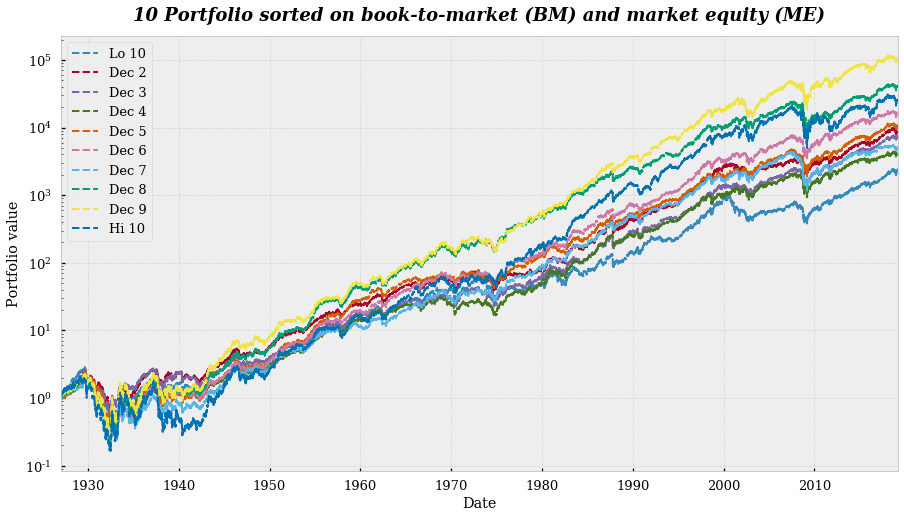

In [84]:
df_HML = dic_HML[0].iloc[:,9:]
df_HML.index = df_HML.index.astype('datetime64[ns]')
print(df_HML.head(n=4))
cumsum_plot(
    df=df_HML,
    title=
    f"{df_HML.shape[1]} Portfolio sorted on book-to-market (BM) and market equity (ME)"
)

### Construct HLM long short portfolio

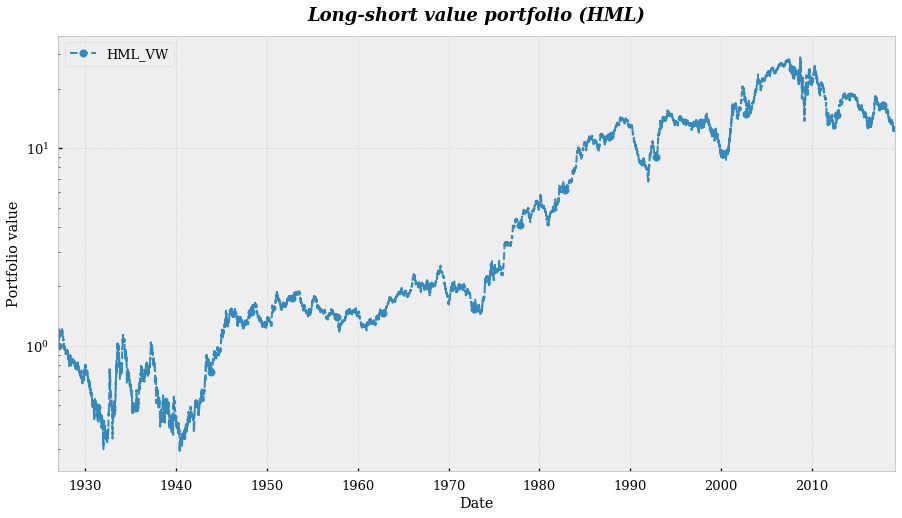

,HML_VW
Date,
1927-01-03,0.09
1927-01-04,-0.93
1927-01-05,0.15
1927-01-06,-0.24
1927-01-07,-0.01


In [86]:
# long short value portfolio
longs, shorts = ['Hi 10'], ['Lo 10']
HML_LS = pd.DataFrame(df_HML.loc[:, longs].values -
                      df_HML.loc[:, shorts].values,
                      columns=['HML_VW'],
                      index=df_HML.index)  # value weighted HML
cumsum_plot(df=HML_LS, title="Long-short value portfolio (HML)")
HML_LS.head(n=5)

 <a id='1.3'></a>
## Winners Minus Losers (WML) portfolio

In [8]:
# load the data for the momentum factor
dic_WML = web.DataReader(MOMENTUM, 'famafrench', start=START_YEAR)
print(dic_WML['DESCR'])

10 Portfolios Prior 12 2 Daily
------------------------------

This file was created by CMPT_PRIOR_RETS_DAILY using the 201902 CRSP database. It contains value- and equally-weighted returns for 10 prior return portfolios. The portfolios are constructed daily. PRIOR_RET is from - 250 to - 21. Missing data are indicated by -99.99 or -999.

  0 : Average Value Weighted Returns -- Daily (24281 rows x 10 cols)
  1 : Average Equal Weighted Returns -- Daily (24281 rows x 10 cols)


In [9]:
df_WML = dic_WML[0]
df_WML.index = df_WML.index.astype('datetime64[ns]')
df_WML.head(n=5)

,Lo PRIOR,PRIOR 2,PRIOR 3,PRIOR 4,PRIOR 5,PRIOR 6,PRIOR 7,PRIOR 8,PRIOR 9,Hi PRIOR
Date,,,,,,,,,,
1927-01-03,0.11,-2.50,-0.97,-0.41,-0.36,-0.87,-0.45,-0.91,-1.00,-1.53
1927-01-04,1.67,0.20,0.57,-0.04,0.18,0.26,0.25,0.59,-0.02,1.05
1927-01-05,1.21,1.09,0.21,0.29,0.16,0.28,0.06,0.03,-0.03,0.08
1927-01-06,-1.00,0.76,-0.15,-0.66,-0.95,-0.18,-0.08,0.03,-0.07,-0.11
1927-01-07,-0.43,0.00,0.02,0.04,0.14,0.32,0.28,0.55,0.48,0.43


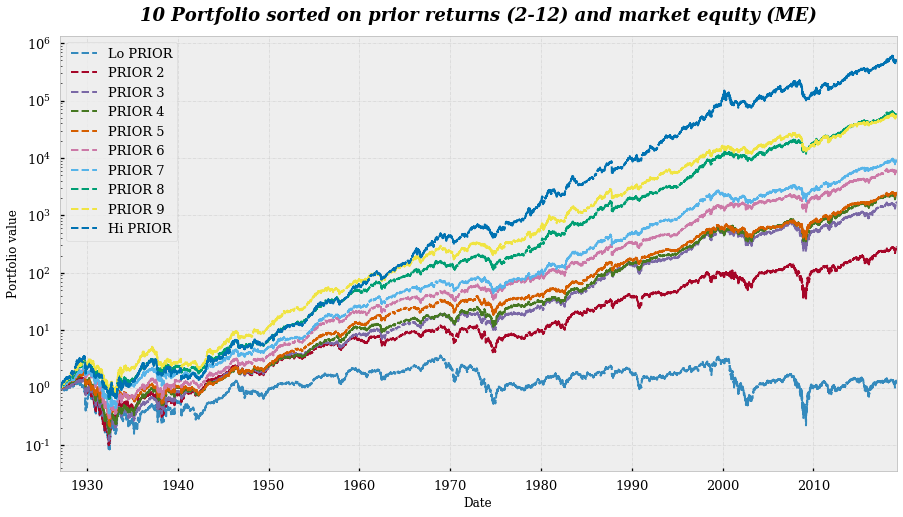

In [10]:
cumsum_plot(
    df=df_WML,
    title=f"{df_WML.shape[1]} Portfolio sorted on prior returns (2-12) and market equity (ME)"
)

### Construct WML long short portfolio

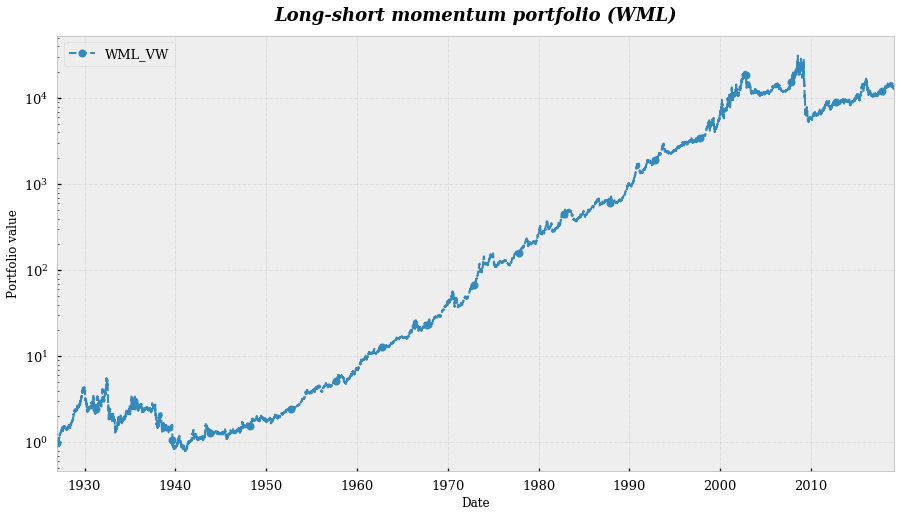

,WML_VW
Date,
1927-01-03,-1.64
1927-01-04,-0.62
1927-01-05,-1.13
1927-01-06,0.89
1927-01-07,0.86


In [11]:
# long short momentum portfolio
longs, shorts = ['Hi PRIOR'], ['Lo PRIOR'] 
WML_LS = pd.DataFrame(df_WML.loc[:, longs].values - df_WML.loc[:, shorts].values,
                      columns=['WML_VW'],
                      index=df_WML.index) 
# plot the cumulative return
cumsum_plot(df=WML_LS, title="Long-short momentum portfolio (WML)")
WML_LS.head(n=5)

<a id='1.4'></a>
## 50-50 Value Momemtum Portfolio 

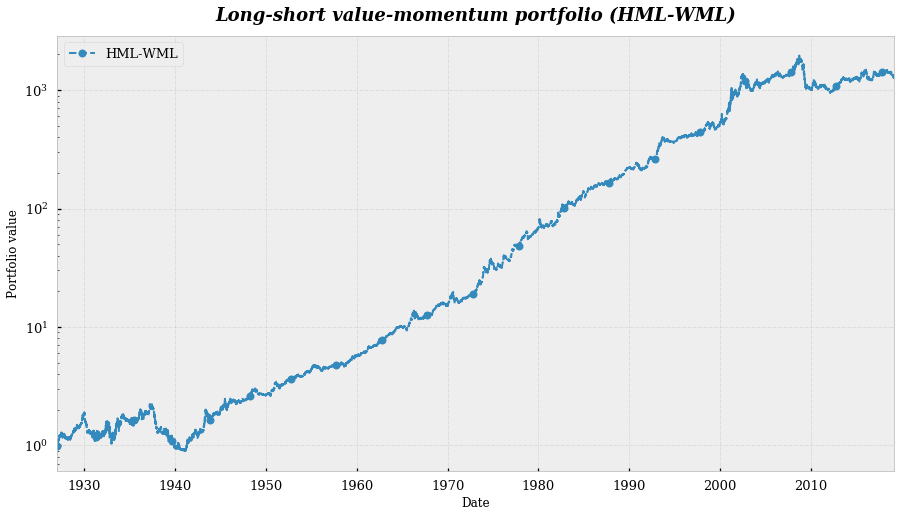

,HML-WML
Date,
1927-01-03,-0.775
1927-01-04,-0.775
1927-01-05,-0.490
1927-01-06,0.325
1927-01-07,0.425


In [12]:
w_HML, w_WML = 0.50, 0.50  #weights 50-50 weights (arbitrarely)

HML_WML = pd.DataFrame(HML_LS.values * w_HML +
                       WML_LS.values * w_WML,
                       columns=["HML-WML"],
                       index=HML_LS.index)

cumsum_plot(df=HML_WML, title="Long-short value-momentum portfolio (HML-WML)")
HML_WML.head()

 <a id='1.5'></a>
## Market Portfolio

This is just the market (Mkt) portfolio minus the risk free rate (RF). I use this as the benchmark since basically every investor (including you and me) can buy this portfolio for almost no fee (there is no performance fee involved). You can think of this portfolio as the **[S&P500](https://en.wikipedia.org/wiki/S%26P_500_Index)**, but containing many more firms.

In [13]:
Mkt_dic = web.DataReader('F-F_Research_Data_Factors_daily', 'famafrench', start=START_YEAR)
Mkt_dic['DESCR']

'F-F Research Data Factors daily\n-------------------------------\n\nThis file was created by CMPT_ME_BEME_RETS_DAILY using the 201902 CRSP database. The Tbill return is the simple daily rate that, over the number of trading days in the month, compounds to 1-month TBill rate from Ibbotson and Associates Inc. Copyright 2019 Kenneth R. French\n\n  0 : (24281 rows x 4 cols)'

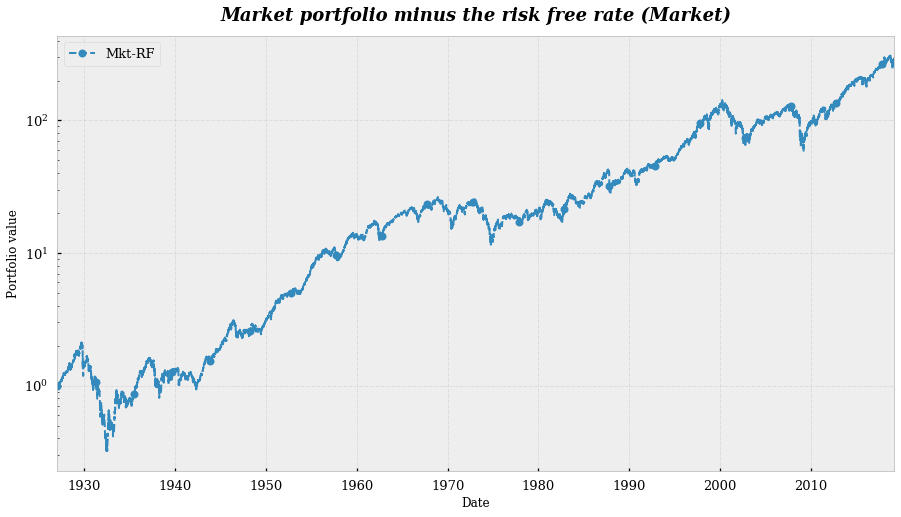

,Mkt-RF
Date,
1927-01-03,-0.79
1927-01-04,0.31
1927-01-05,0.14
1927-01-06,-0.17
1927-01-07,0.30


In [14]:
Mkt = Mkt_dic[0]
Mkt = pd.DataFrame(Mkt.loc[:,"Mkt-RF"], columns=["Mkt-RF"])
cumsum_plot(df=Mkt, title="Market portfolio minus the risk free rate (Market)")
Mkt.head()

 <a id='1.6'></a>
## Compare 4 factors
   - Market factor (Mkt-RF)
   - Value factor (HML)
   - Momemtum factor (WML)
   - 50-50 value-momemtum portfolio (HML-WML)

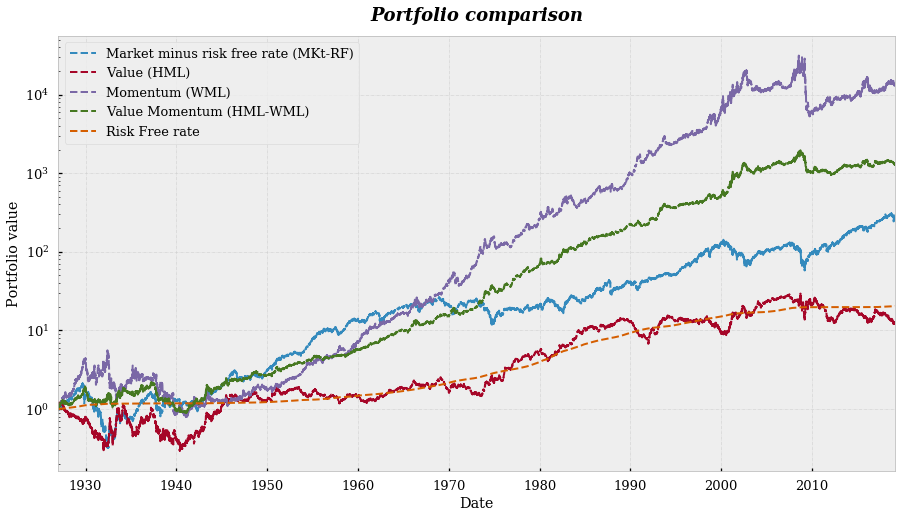

,Mkt-RF,HML,WML,HML-WML,RF
Date,,,,,
1927-01-03,-0.79,0.09,-1.64,-0.775,0.01
1927-01-04,0.31,-0.93,-0.62,-0.775,0.01
1927-01-05,0.14,0.15,-1.13,-0.490,0.01
1927-01-06,-0.17,-0.24,0.89,0.325,0.01
1927-01-07,0.30,-0.01,0.86,0.425,0.01


In [15]:
reload(simulation_log_lib)
from simulation_log_lib import *

df_factors = pd.DataFrame(Mkt["Mkt-RF"], columns=["Mkt-RF"])
df_factors["HML"] = HML_LS
df_factors["WML"] = WML_LS
df_factors["HML-WML"] = HML_WML
df_factors["RF"] = Rf

# alternative legend labels
dic_fac = {
    "Mkt-RF": "Market minus risk free rate (MKt-RF)",
    "HML": "Value (HML)",
    "WML": "Momentum (WML)",
    "HML-WML": "Value Momentum (HML-WML)",
    "RF":"Risk Free rate"
}

# plot
cumsum_plot(df=df_factors, dic=dic_fac, title="Portfolio comparison",simple=False)
df_factors.head()

<a id='Chapter2'></a>
# Chapter 2:  Risk- risk reward ratio's and Data exploration

Before starting with the simulation exercise, I introduce some performance statistics and perform some data exploration. The goal is to gain insights that give us intuition about the data.

<a id='2.1'></a>
## Return and risk reward ratio's 

**when working with log returns:** 


The **geometric mean** of quantities $\{a_{1}, \dots, a_{n}\}$ is

\begin{equation}
\overline{a}_{g}=(\prod_{i=1}^{n} a_{i})^{1 / n}
\end{equation}

Taking the logarithm of both sides gives
\begin{equation}
\log \overline{a}_{g}=\frac{1}{n} \sum_{i=1}^{n} \log a_{i}
\end{equation}


so the log of the geometric mean is equal to the arithmetic mean of the logs.
In  case, the relevant quantities $a_i$ are the growth rates over each period

\begin{equation}
a_{i}=1+r_{i}
\end{equation}

and plugging this into the above equation gives

\begin{equation}
\log (1+\overline{r}_{g})=\frac{1}{n} \sum_{i=1}^{n} \log(1+r_{i})
\end{equation}

\begin{equation}
\overline{r}_{g}=\exp(\frac{1}{n} \sum_{i=1}^{n} log(1+r_{i})-1
\end{equation}


Sometimes the geomtric return is  approximated by the following formula:

\begin{equation}
\overline{r}_{g}=\frac{1}{n} \sum_{i=1}^{n} \log (1+r_{i})
\end{equation}

this is because when the growth rate is small,

\begin{equation}
\log (1+\overline{r}_{g}) \approx \overline{r}_{g}
\end{equation}

it is often an approximation that you can get away with

**Simple raw returns**

- **Arithmetic return**: 

\begin{equation} R_{a} =
\frac{1}{n} \sum_{i=1}^{n} r_{i}=\frac{r_{1}+r_{2}+\cdots+r_{n}}{n}
\end{equation}

- **Geometric return**: 

\begin{equation} R_{g} = 
\sqrt[n]{(1+r_{1}) \times (1+r_{2}) \times \ldots(1+r_{n})}-1
\end{equation}

suppose returns are at daily frequency, to annualize the arithmetic or geometric I take $(1+R)^{252} - 1$ (assuming 252 trading days in a year)


- **Sharpe ratio**: one of the most common risk-reward ratios used in finance is the Sharpe ratio. The Sharpe ratio discounts the expected excess returns of a portfolio $ {E(r)-r_{f}} $ by the volatility of the returns $\sigma_r$. Formally, this can be described as follow:


\begin{equation}
S=\frac{E(r_{e})}{\sigma_{r}}=\frac{E(r)-r_{f}}{\sigma_{r}}
\end{equation}

$\sigma=\sqrt{\sigma^{2}}=\sqrt{\frac{1}{N} \sum_{i=1}^{N} (r_{i}-\mu)^{2}}$ and $\mu=\frac{1}{N} \sum_{i=1}^{N} r_{i}$

**Crude estimation of annualized volatility**

Most often volatility is annualized by multiplying by $\sqrt(n)$ where $n$ represents the time period (number of trading days or trading months). The formula uses the the fact that the standard deviation of the sum of $n$ independent variables (with equal standard deviations) is $\sqrt(n)$ times the standard deviation of the individual variables. This is only a crude approximation of the true volatility observed in financial markets and is only an accurate extrapolation if prices follow a random walk or Wiener process, whose steps have finite variance. As a result we will probably underestimate volatility. There are other ways (probably better) to measure volatility, but these are not the focus of this project.

**Lower Partial Moments (LPM)**

Whereas measures of risk-adjusted return based on volatility treat all deviations from the mean as risk, measures of risk-adjusted return based on lower partial moments  consider only deviations below some predefined minimum return threshold, $\tau$ as risk. For example, negative deviations from the mean is risky whereas positive deviations are not. A lower partial moment of order $j$ can be estimated from a sample of $k$ returns as follows: 

\begin{equation}
L P M_{j}(\tau)=\frac{1}{k} \sum_{i=1}^{k} \max \left(\tau-r_{i}, 0\right)^{j} 
\end{equation}


A useful classification of measures of risk-adjusted returns based on lower partial moments is by their order ($j$). The larger the order the greater the weighting will be on returns that fall below the target threshold ($\tau$), meaning that larger orders result in more risk-averse measures. Some popular measures using the equation above are:

   - **The Sortino ratio** was proposed as a modification to the Sharpe ratio. It discounts the excess return of a portfolio above a target threshold by the volatility of downside returns, $\delta^{2}$, instead of the volatility of all returns, $\sigma^2$. The volatility of downside returns is equivalent to the square-root second-order lower partial moment of returns. More formally this can be described as follow:
   
   \begin{equation}
S O R(\tau)=\frac{E(r_{e})}{\delta^{2}}=\frac{E(r)-\tau}{\delta^{2}}=\frac{E(r)-\tau}{\sqrt{L P M_{2}(\tau)}}
\end{equation}
   

   - **The Omega ratio** discounts the excess returns of a portfolio above the target threshold, usually the risk-free rate, by the first-order lower partial moment of the returns. The first-order lower partial moment corresponds to the average expected loss also known as downside risk. Formally the omega ratio is defined as follow:
   
   \begin{equation}
\Omega(\tau)=\frac{E(r_{e})}{L P M_{1(\tau)}}=\frac{E(r)-\tau}{L P M_{1}(\tau)}
\end{equation}
   

   - **The Kappa ratio** is a generalization of Omega and Sortino ratio.  It was shown that when the parameter $j$ of the Kappa ratio is set to one or two you get the Omega or Sortino ratio. The Kappa ratio is most often used with $j=3$ which is why it is often referred to as the Kappa 3 ratio. Formally:
   
   \begin{equation}
K_{j}(\tau)=\frac{E(r_{e})}{\sqrt[j]{L P M_{j}(\tau)}}=\frac{E(r)-\tau}{\sqrt[j]{L P M_{j}(\tau)}}
\end{equation}


Another measure to look at is risk is **Drawdown**.  It is the maximum decrease in the value of the portfolio over a specific period of time. Given the historical prices (values) for a portfolio, $S$, and a period of time, $t$, the drawdown of length $t$ over that period of time is the maximum distance between a previous two values $S_x$ and $S_{x−t}$,
   
   \begin{equation}
D(t)=\max \{0, \max _{t_{i} \in(0, t)}\{S_{t_{i}}-S_{t_{i}-t}\}\}
\end{equation}


**Maximum drawdown** can be thought of as a list of drawdowns calculated from the same historical portfolio values, $S$, but for the whole time period (or for different sub time periods, rolling window). The maximum drawdown of a portfolio is the maximum decrease in portfolio value from a previous high to a new low.

**% Time underwater** is the percentage time the investment is in in a drawdown state. 

Personally, I like measures based on drawdowns since they are extremely intuitive and are a very natural way to look at risk. Contrary to other measures, drawdown is path dependent. Furthermore, I very much enjoyed the presentation of Rober Frey (Former Quant of the Medallion fund) on drawdown [**180 years of market drawdown**](https://www.youtube.com/watch?v=27x632vOjXk&t=3349s).

**<font size="5">Helper functions</font>** 
 - `Kappa_ratio:` calculates the kappa ratio 
 - `drawdown:` calculates drawdown
 - `Anonymous functions (lambda):` performance functions stored in a dictionary
 -  `perf_stats:` a wrapper around the anonymous functions to give the possibility for selecting the function(s) of interest
 - `Return_DD:`calculates the cumulative return and drawdown in one figure


In [16]:
"""
some anonymous function to calculate various (performance) statistics,
these functions are stored in a dictionary

params:

    - df: pandas dataframe with the raw returns
    - time_freq: an integer indicating the number of trading days
    - treshold: a float determining the level of drawdown is taken into account
      when calculating the percentage of time an investment is in a drawdown state
    - rf: pandas dataframe with the risk free rate,
          this is only applied to the arithmetric and geometric return if specified

returns:

    - numpy array with the calculted statistic
"""


def P_Ar(time_freq=FREQUENCY, df=None, rf=None): return\
    np.mean(df.values, axis=0)*time_freq if rf is None else\
    np.mean(df.values-rf.values, axis=0)*time_freq


def P_Gr(time_freq=FREQUENCY, df=None, rf=None): return \
    (np.exp(time_freq*np.mean(df.values/100, axis=0))-1)*100 if rf is None else\
    (np.exp(time_freq*np.mean((df.values-rf.values)/100, axis=0))-1)*100


def P_Avol(time_freq=FREQUENCY, df=None): return \
    np.std(df.values, axis=0) * np.sqrt(time_freq)


def P_Gvol(time_freq=FREQUENCY, df=None): return \
    (np.exp(np.sqrt(time_freq)*np.std(df.values/100, axis=0))-1)*100


# put functions into a dictionary, so we can choose which one to call
perf_stats_dic = {

    "Skew": lambda df=None: df.skew().values,

    "Kurtosis": (lambda df=None: df.kurtosis().values),

    "Terminal Wealth Relative": lambda df=None:
    np.exp((df / 100).cumsum()).iloc[-1, :] - 1,

    "Arithmetric Return (%)": lambda time_freq=FREQUENCY, df=None:
    P_Ar(df=df, time_freq=time_freq),

    "Geometric Return (%)": lambda time_freq=FREQUENCY, df=None:
    P_Gr(df=df, time_freq=time_freq),

    "Excess Arithmetric Return (%)": lambda time_freq=FREQUENCY, df=None, rf=None:
    P_Ar(df=df, rf=rf, time_freq=time_freq),

    "Excess Geometric Return (%)": lambda time_freq=FREQUENCY, df=None, rf=None:
    P_Gr(df=df, rf=rf, time_freq=time_freq),

    "Arithmetric Volatility (%)": lambda time_freq=FREQUENCY, df=None:
    P_Avol(df=df, time_freq=time_freq),

    "Geometric Volatility (%)": lambda time_freq=FREQUENCY, df=None :
    P_Gvol(df=df, time_freq=time_freq),

    "Arithmetric SR": lambda time_freq=FREQUENCY, df=None, rf=None:
    P_Ar(df=df, rf=rf, time_freq=time_freq) /
    P_Avol(df=df, time_freq=time_freq),

    "Geometric SR": lambda time_freq=FREQUENCY, df=None, rf=None:
    P_Gr(df=df, rf=rf, time_freq=time_freq) / P_Gvol(df=df, time_freq=time_freq),
    
    "Max Drawdown (%)": lambda df=None: np.max(drawdown(df=df), axis=0) * 100,

    "Max time in DD (Year)": lambda time_freq=FREQUENCY, df=None:
    np.max(np.apply_along_axis(max_time_dd, 0, drawdown(df=df)), axis=0)/time_freq,

    "Underwater (%)": lambda df=None: np.sum(drawdown(df=df) != 0, axis=0) / len(df) * 100,

    f"(%) Underwater >{20} %":lambda treshold=0.20, df=None:
    np.sum(drawdown(df=df) > treshold, axis=0) / len(df) * 100
}

<a id='2.2'></a>
## Data exploration

### Convert to log space

I have decided to work in log space instead of simple returns.

In [17]:
# convert to log space
df_factors_log = np.log(1+df_factors/100)*100
df_factors_log.head()

,Mkt-RF,HML,WML,HML-WML,RF
Date,,,,,
1927-01-03,-0.793137,0.089960,-1.653597,-0.778019,0.01
1927-01-04,0.309520,-0.934352,-0.621930,-0.778019,0.01
1927-01-05,0.139902,0.149888,-1.136433,-0.491204,0.01
1927-01-06,-0.170145,-0.240288,0.886063,0.324473,0.01
1927-01-07,0.299551,-0.010001,0.856323,0.424099,0.01


In [18]:
# geometric return via simple returns
((1+df_factors/100).cumprod().iloc[-1,]**(252/len(df_factors))-1)*100

# geometric return via log retuns
np.exp(252*np.mean(df_factors_log/100))-1

# geometric standar deviation
np.exp(np.sqrt(252)*np.std(df_factors_log/100))-1

Mkt-RF     0.184569
HML        0.193880
WML        0.251138
HML-WML    0.137317
RF         0.001907
dtype: float64

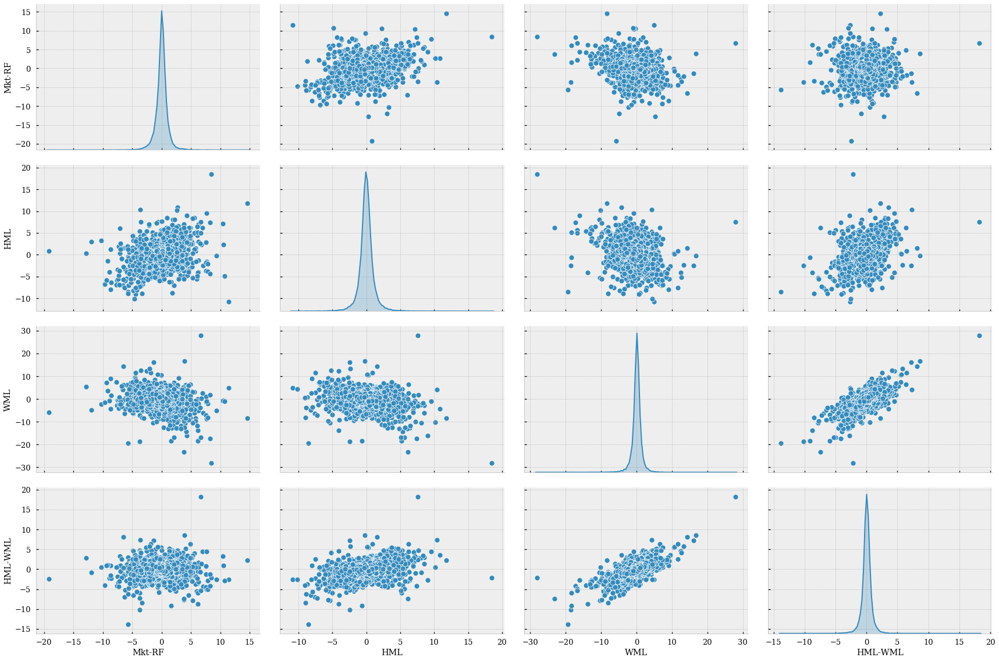

In [19]:
sns.pairplot(df_factors_log.iloc[:,:4], height=4, aspect=1.5, diag_kind="kde");

### Full sample period: 1927:2019

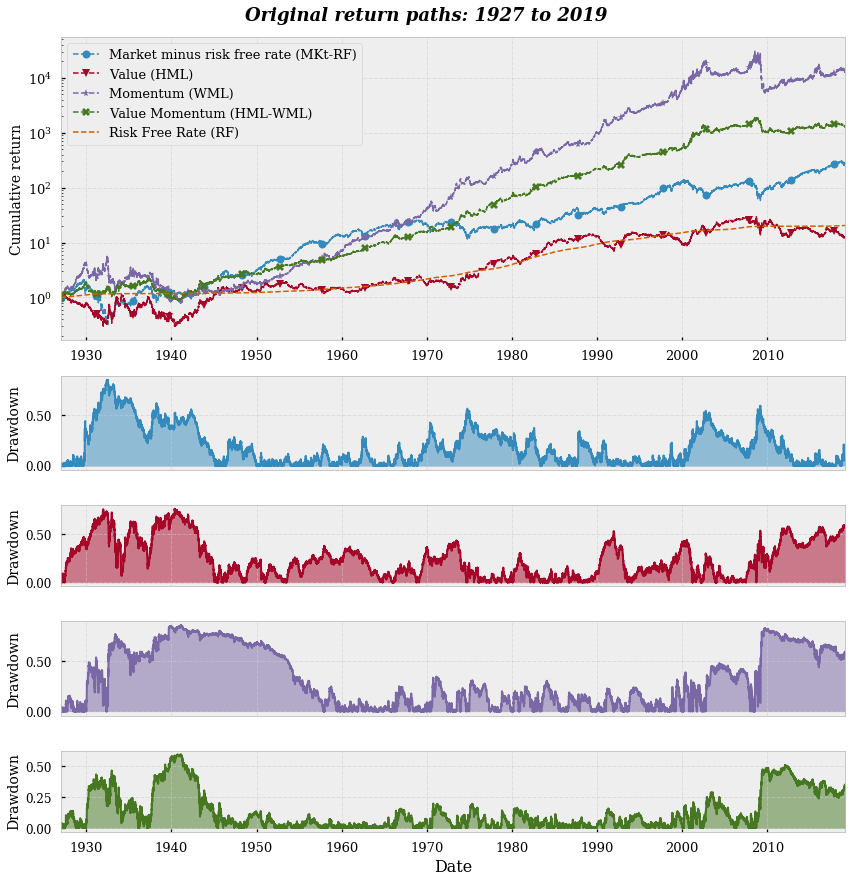

In [20]:
Return_DD(df=df_factors_log, dic_labels=dic_fac, loc='upper center',
          time_frequency=FREQUENCY,height_ratio=[2.25, .7, .6, .7,.6],
          factor=['Mkt-RF', 'HML', 'WML','HML-WML'])
# plt.savefig('Cum_return_DD', bbox_inches='tight') # save plot

###  Period: 1927-1935
 - crash of 1930

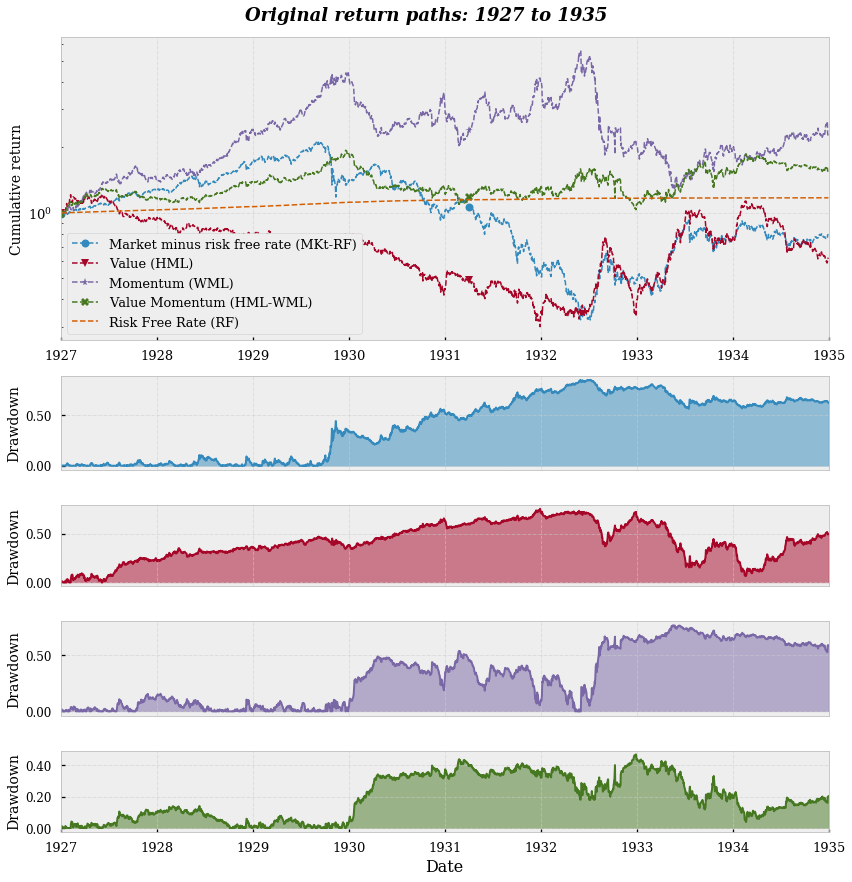

In [21]:
start, end = datetime.date(year=1927, month=1, day=1), datetime.date(year=1935,
                                                                     month=1,
                                                                     day=1)
Return_DD(df=df_factors_log,
          dic_labels=dic_fac,
          loc='upper left',
          start=start,
          end=end,
          time_frequency=FREQUENCY)

### Period: 1998-2010
 - Technology crash of 2000
 - Financial crash of 2007

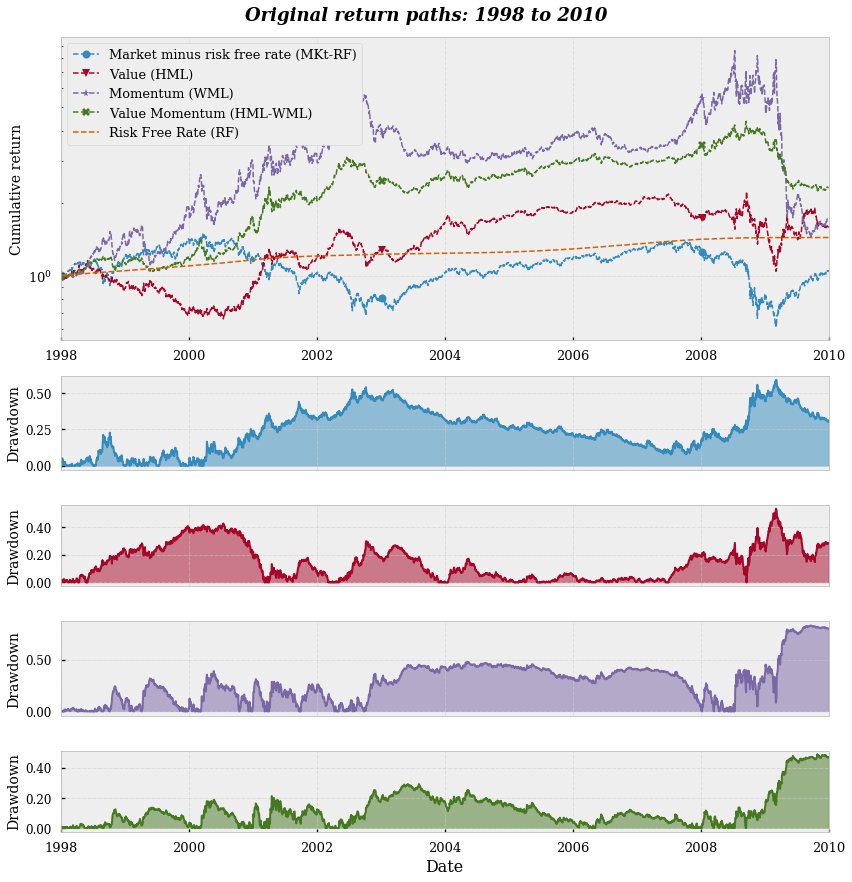

In [22]:
start, end = datetime.date(year=1998, month=1, day=1), datetime.date(year=2010,
                                                                     month=1,
                                                                     day=1)
Return_DD(df=df_factors_log,
          dic_labels=dic_fac,
          loc='upper center',
          start=start,
          end=end,
          time_frequency=FREQUENCY)

In all serious drawdown periods, momentum crashes when the market starts rebouncing. This is in line what's described in the literature. Also note the negative correlation between value and momentum and momentum and the market.

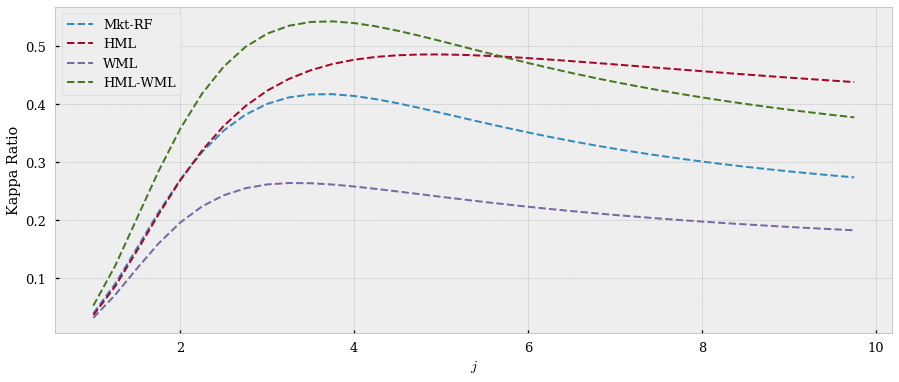

In [23]:
# just use the risk free rate: meaning we use excess return in the numerator
threshold_return = df_factors_log.iloc[:,4].values.reshape(len(df_factors),1)
dic = {i: kappa_ratio(df=df_factors_log.iloc[:,:4],threshold_return=threshold_return,
       order=i, time_freq=FREQUENCY) for i in (np.arange(1, 10, 0.25))}

out = pd.DataFrame(dic).T
out = out.rename(columns={0: "Mkt-RF", 1: "HML", 2: "WML", 3: "HML-WML"})
fig = figsize = (15, 8)
fig, (ax1) = plt.subplots(1, 1, figsize=(15, 6))
for i, c in enumerate(out.columns):
    ax1.plot(out.index, out[c], label=str(c), linestyle="--")
    ax1.set_xlabel("$j$")
    ax1.set_ylabel("Kappa Ratio")
    ax1.legend(loc='best')

Increasing the power ($j$) of the `kappa ratio` gives higher weight to deviations below the treshold ($\tau$=0). It is interesting to see that the  momenetum strategy intially has a higher kappa ratio, but get surpassed around $j=3$ by the value portfolio. This means the momentum portfolio contains some large negative returns (tail events).

In [25]:
round(perf_stat(df=df_factors_log.iloc[:,:4],dic_perf=perf_stats_dic,all_stats=True), 3)


,Mkt-RF,HML,WML,HML-WML
Skew,-0.419,0.303,-1.424,-0.318
Kurtosis,17.414,12.775,36.073,25.629
Terminal Wealth Relative,290.565,11.163,13062.719,1273.726
Arithmetric Return (%),5.890,2.593,9.836,7.421
Geometric Return (%),6.067,2.627,10.336,7.703
Excess Arithmetric Return (%),5.890,2.593,9.836,7.421
Excess Geometric Return (%),6.067,2.627,10.336,7.703
Arithmetric Volatility (%),16.938,17.721,22.405,12.867
Geometric Volatility (%),18.457,19.388,25.114,13.732
Arithmetric SR,0.348,0.146,0.439,0.577


**Some observations with respect to performance assessment of the four portfolios**

- Momentum seems to be the more "risky" strategy when looking at `skewness, kurtosis, kappa ratio` though it has not the highest `drawdown`. Note that the Sharpe ratio does not reveal this sort of information ( IMO, it does not make much sense to look at the Sharpe ratio when returns are not normally distributed).

- **Around 93%** of the time, the portfolios are in a state of drawdown (a state of regret). Meaning if we pick a random day, there is very high likelihood that there was some point in time we had more money. I think this an under appreciated fact and has a big impact on emotional state of investors. Note that this is not something specific for value or momentum investing. It is a feature of most investment strategies (even very good ones, see [**180 years of market drawdown**](https://www.youtube.com/watch?v=27x632vOjXk&t=3349s))

- Max time in DD (year): these are rather scary statistics; 28 year without making a single dime. OK we are looking at the extreme here, but still something to keep in mind.

- Big differences between the four portfolios when looking at the `(%) underwater > 20 %` (I kind of arbitrarily chose 20 % to indicate a big drawdown). The difference is especially large between the value and momentum strategy (43% vs 17%). Momentum experiences two very big drawdown period 1930-1960 and 2009-today.

- Combining value and momentum (HML-WML) improves risk adjusted performance on almost all statistics, though this relation is time dependent and seems to have disappeared over the last decade (see later).


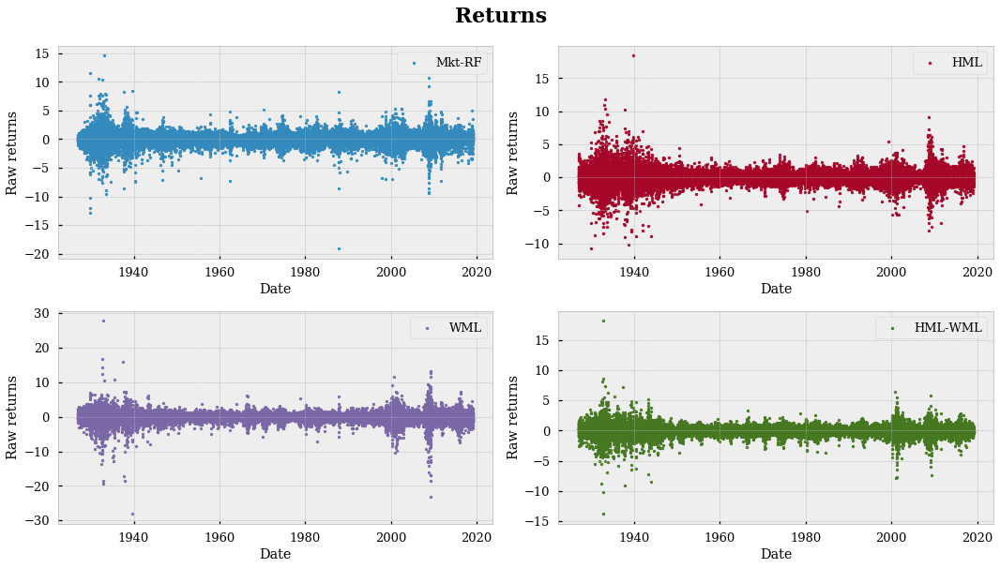

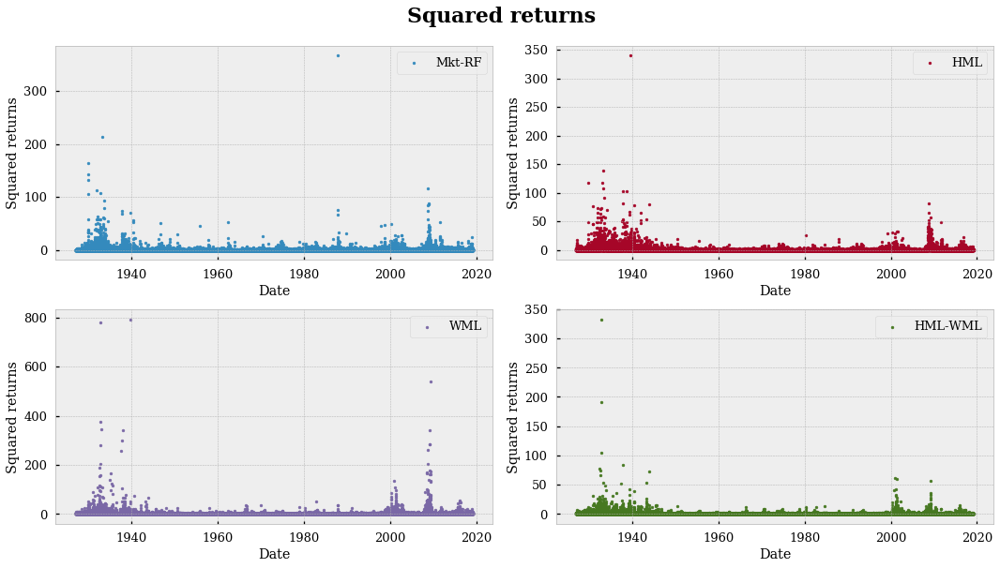

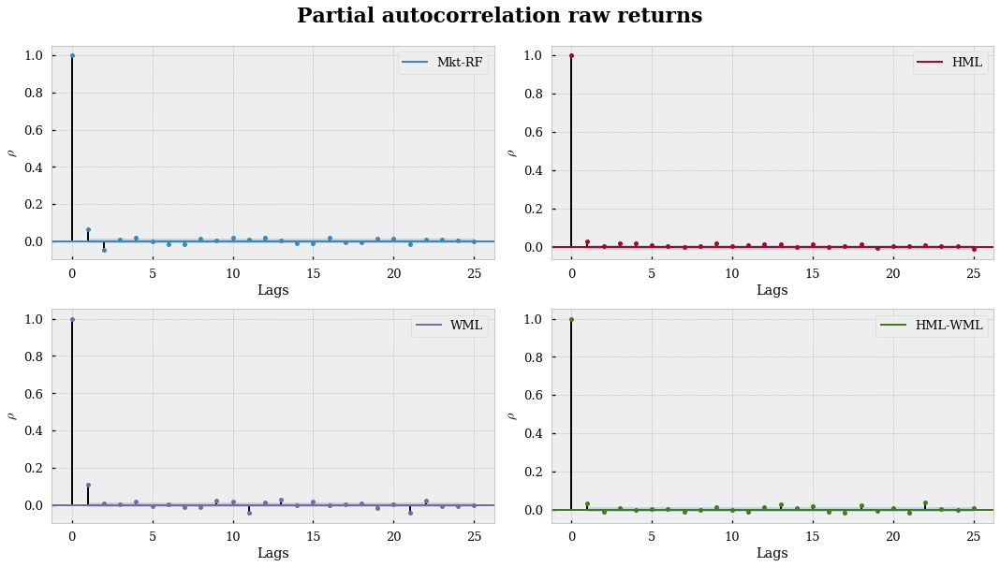

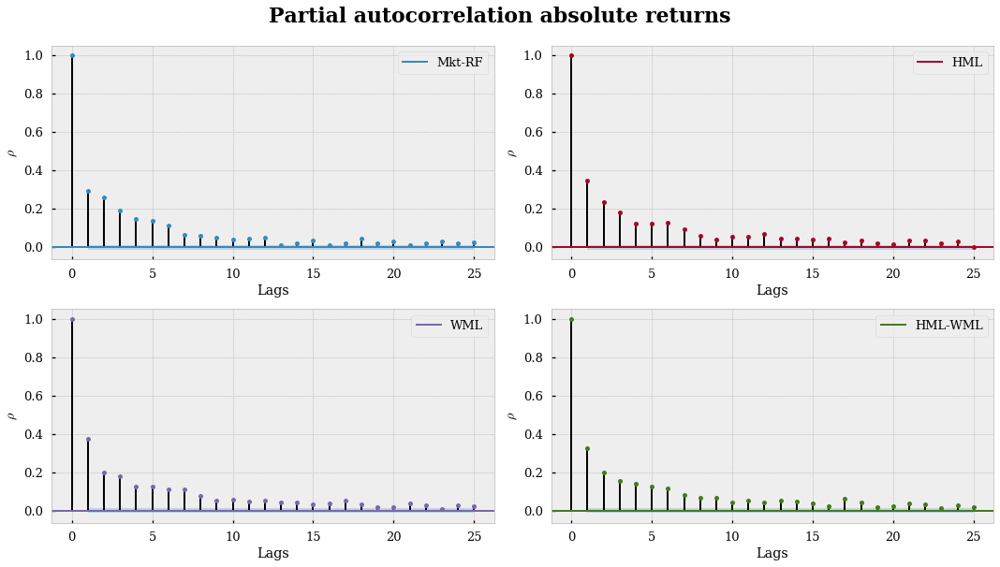

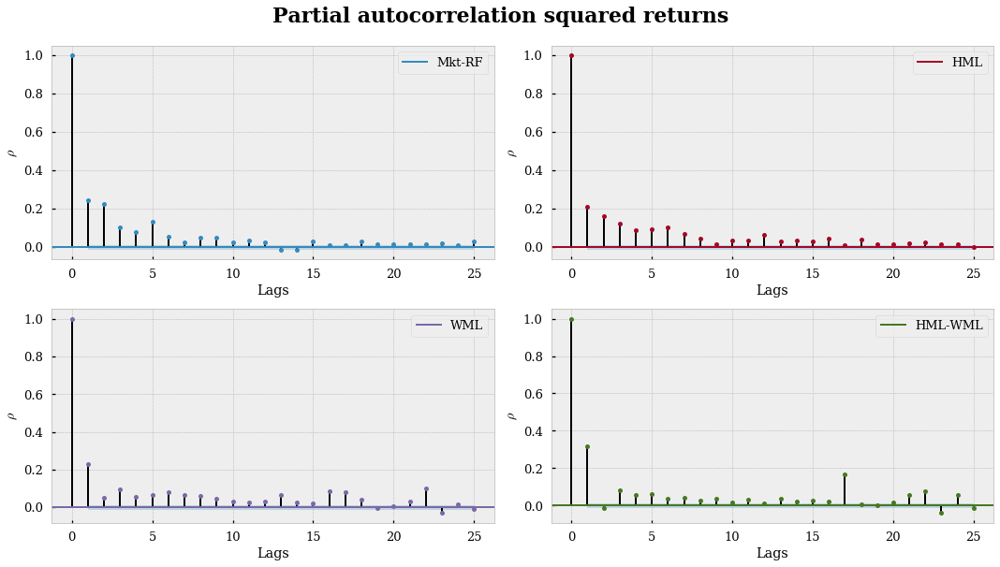

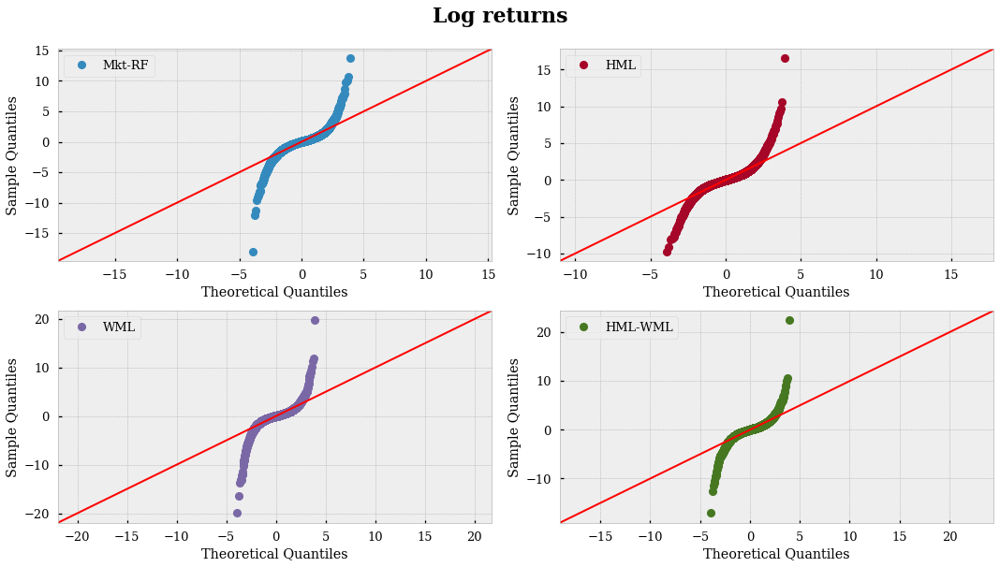

In [26]:
# Returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
index = df_factors_log.index
for i, j in enumerate(df_factors.iloc[:,:4].columns):
    axs[i].scatter(index,
                   df_factors_log.iloc[:, i].values,
                   label=j,
                   color=set2[i],
                   s=8)
    axs[i].set_xlabel("Date")
    axs[i].set_ylabel("Raw returns")
    axs[i].legend(loc="best")
plt.tight_layout()
plt.suptitle('Returns', y=1.05, fontsize=22, fontweight="bold")

# Squared returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()

for i, j in enumerate(df_factors.iloc[:,:4].columns):
    axs[i].scatter(index,
                   df_factors_log.iloc[:, i].values**2,
                   label=j,
                   color=set2[i],
                   s=8)
    axs[i].set_xlabel("Date")
    axs[i].set_ylabel("Squared returns")
    axs[i].legend(loc="best")
plt.tight_layout()
plt.suptitle('Squared returns', y=1.05, fontsize=22, fontweight="bold")

# Partial autocorrelation: returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors_log.iloc[:,:4].columns):
    plot_pacf(df_factors.iloc[:, i].values,
              ax=axs[i],
              label=j,
              lags=25,
              color=set2[i])
    axs[i].set_xlabel("Lags")
    axs[i].set_ylabel('$\\rho$')
    axs[i].set_title("")
    #axs[i].set_ylim(-0.5,0.5)
    handles, labels = axs[i].get_legend_handles_labels()
    handles = handles[:-len(handles) // 3][0::1]
    labels = labels[:-len(handles) // 3][0::1]
    axs[i].legend(handles=handles, labels=labels, loc='best')
plt.tight_layout()
plt.suptitle('Partial autocorrelation raw returns',
             y=1.05,
             fontsize=22,
             fontweight="bold")

# Partial autocorrelation: squared returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors_log.iloc[:,:4].columns):
    plot_pacf(abs(df_factors_log.iloc[:, i]).values,
              ax=axs[i],
              label=j,
              lags=25,
              color=set2[i])
    axs[i].set_xlabel("Lags")
    axs[i].set_ylabel('$\\rho$')
    axs[i].set_title("")
    #axs[i].set_ylim(-0.5,0.5)
    handles, labels = axs[i].get_legend_handles_labels()
    handles = handles[:-len(handles) // 3][0::1]
    labels = labels[:-len(handles) // 3][0::1]
    axs[i].legend(handles=handles, labels=labels, loc='best')
plt.tight_layout()
plt.suptitle('Partial autocorrelation absolute returns',
             y=1.05,
             fontsize=22,
             fontweight="bold")

# Partial autocorrelation: squared returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors_log.iloc[:,:4].columns):
    plot_pacf(df_factors_log.iloc[:, i].values**2,
              ax=axs[i],
              label=j,
              lags=25,
              color=set2[i])
    axs[i].set_xlabel("Lags")
    axs[i].set_ylabel('$\\rho$')
    axs[i].set_title("")
    #axs[i].set_ylim(-0.5,0.5)
    handles, labels = axs[i].get_legend_handles_labels()
    handles = handles[:-len(handles) // 3][0::1]
    labels = labels[:-len(handles) // 3][0::1]
    axs[i].legend(handles=handles, labels=labels, loc='best')
plt.tight_layout()
plt.suptitle('Partial autocorrelation squared returns',
             y=1.05,
             fontsize=22,
             fontweight="bold")

# QQplot: log returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors_log.iloc[:,:4].columns):
    sm.qqplot(df_factors_log.iloc[:, i].values,
              fit=True,
              line='45',
              label=j,
              ax=axs[i],
              color=set2[i])
    axs[i].legend(loc="best")
plt.tight_layout()
plt.suptitle('Log returns', y=1.05, fontsize=22, fontweight="bold");

**some observations (all strategies)**

 - Returns are hetroskedastic:  return volatility is high during the 1930s, and one can argue that this period is a different regime, unlikely to repeat (some papers exclude the period 1927-1963 because of this, I personally disagree with this). In contrast, 1941–1962 is a period of relatively low return volatility. Thereafter, we observe similar behavior as in the 1930's.
 - Serial correlations in the simple returns is rather low, but much higher serial correlations in the absolute and squared returns (I am quite surprised, this is promising for the second part of the thesis).
 - Return are not normally distributed.

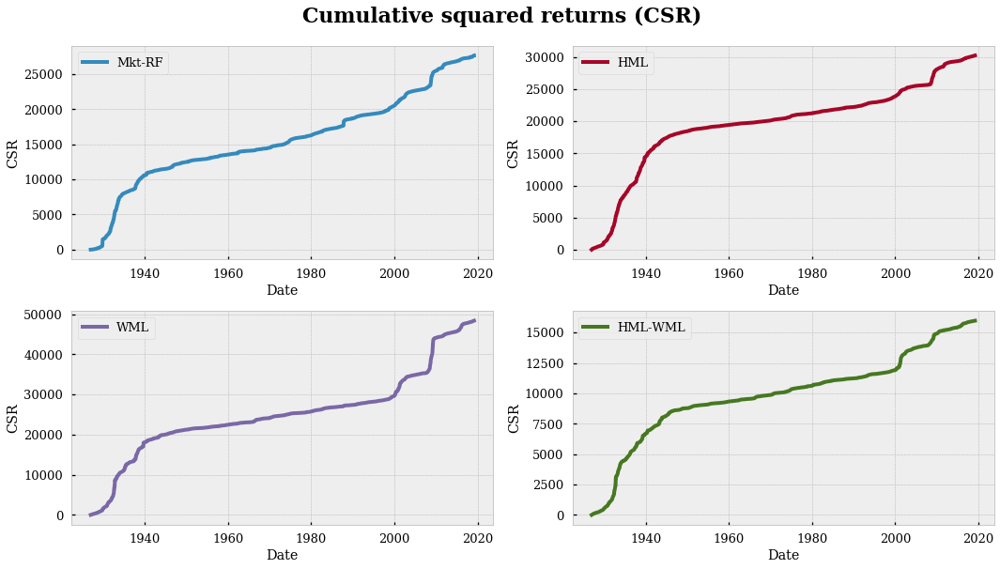

In [27]:
# Cumulative squared returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors_log.iloc[:,:4].columns):
    axs[i].plot(df_factors_log.index, (df_factors_log.iloc[:, i]**2).cumsum(),
                label=j,
                color=set2[i],
                lw=4)
    axs[i].legend(loc="best")
    axs[i].set_ylabel("CSR")
    axs[i].set_xlabel("Date")
plt.tight_layout()
plt.suptitle('Cumulative squared returns (CSR)',
             y=1.05,
             fontsize=22,
             fontweight="bold");

**Cumulative Squared Returns (CSR)**

The CSR is a “quick and dirty” approach to look at volatility regimes. The variance, $\sigma_r^2$, of return can be expressed by the following, where $R$  is the random variable representing return:

\begin{equation}
\sigma_{r}^{2}=\mathrm{E}\left[R^{2}\right]-\mathrm{E}[R]^{2}
\end{equation}

If we take the maximum likelihood estimate (MLE) for the sample variance, $\hat{s}_r^2$ , and multiply both sides by the sample size, $n$ , we have

\begin{equation}
n \hat{s}_{r}^{2}=\sum_{t=1}^{n} r(t)^{2}-\frac{\left(\sum_{t=1}^{n} r(t)\right)^{2}}{n}
\end{equation}

For most return time series the term to the left of the minus sign is much larger than the term on the right. This leads to the following approximation:

\begin{equation}
n \hat{s}_{r}^{2} \simeq \sum_{t=1}^{n} r(t)^{2}
\end{equation}

Thus, when plotting the cumulative square returns (CSR), the slope of the CSR line is approximately the variance of those returns. If the return switches from one stable volatility regime to another, then this shift shows as an abrupt change in slope of the CSR. This is a simple but powerful exploratory data analysis technique. The idea is to gain insights that give intuition about the data. Of course, you want to make sure that our insights make sense, but at this stage I am not super concerned with the formalities.


Looking at the CSR it does appear that a piecewise model yields a reasonably good description. There are extended periods where the slope is roughly constant, and these are separated by definite knits showing rapid transition from one regime to another.

**Next steps (difficult in python)**

My next step was to approximate the CSR with a piecewise linear model and look how these slopes change over time. The slope of the $i^{th}$ line segment ($\tau$)  would  the estimate of the constant variance. If we multiple each variance by $12$ or $252$ (depending if you use monthly or daily data) and then take the square root, then we have an annualized estimate of the standard deviation:

\begin{equation}
\hat{S}_{\text { annual }}\left(\tau_{i}\right)=\sqrt{252 \times \hat{s}_{\text { daily }}\left(\tau_{i}\right)^{2}}
\end{equation}


Doing the above in the **R programming language** seems a lot more practical (there are some packages which identify changing points). So far, I have experimented a bit with this, the problem is determining the cutpoints to fit the piecewise model (I tried with a simple decidision tree which gave actually nice results). If I have time left, I will take another look at this. Suggestions are also welcome.

<a id='Chapter3'></a>

# Chapter 3: Simulation analysis Part 1

It seems likely that the characteristics of long-horizon returns are of central interest to investors saving for distant payoffs. I use simulations to study distributions of U.S. stock returns the distributions of annual, and 3-, 5-, 10-, 20-, and 30-year returns on the  Market portfolio (Mkt-RF), value portfolio (HML), a momentum portfolio (WML)  and a 50-50 value-momentum portfolio (HML-WML) of U.S. stocks for January 1927 to February 2019 (henceforth 1927–2019). Sample sizes shrink quickly as the return horizon increases. I use (bootstrap) simulations to fill in details of long horizon return distributions. 

**Portfolios**

- market (Mkt-RF)
- Value (HML)
- Momentum (WML)
- 50-50 Value-Momentum (HML-WML) 

**simulations methods**

   - sample returns from a normal distributions using the $\mu$ and $\sigma$ estimated from the data
   - Independent identical distributed (i.i.d.) bootstrap
   - circular bootstrap
   - stationairy bootstrap

**statistics of interest**

I focus on the following three statistics which I consider important elements of any investment strategy:
 
 - geometric return (annualized) 
 - the number of times we end up with a positive return (based on geometric return)
 - Maximum Drawdown
 
Regarding the maximum drawdown, I am concerned whether this makes sense, since this is an extrema statistic.

**Investment horizon**

- 1-3-5-10-20-30 years

**Blocksize and number of simulations**

- blocksize: 252 days
- nr simulations: 10 000

Regarding **geometric return**, I expect it to converge toward a normal distributions (this is a rather simple and well behaved statistic IMO) as the investment horizon increases. I am most of all curious about how fast the variance will drop as you increase the investment horizon.

Regarding **maximum drawdown**, I honestly don't know what to expect (maybe some kind of right skewed distribution?). As you increase the investment horizon you will experience larger maximum drawdown by construction (your biggest loss is in the future). Does it even makes sense to look at such a statistic in a bootstrap setting?

### Helper functions

 - `boot:` iterates over the bootstrap paths and puts it into a dataframe
 - `sample_normal:` samples data from a normal distribution and puts it into a dataframe
 - `plot_summary_stats:` visualizes the histograms from all the statistics when calling the bootstrap method (the default setting is not showing since this is a bit too much output)
 - `investment_horizons:` wraps around the functions from above and iterates over the simulation methods
 - `permutation_plot:` visualizes the permuted sample statistic(s) of interest. Note this will show the same histogram as those in `plot_summary_stats`
 - `append_stats:` appends the calculated statistic together in a pandas dataframe for each:
<br>

      - strategy
      - simulation method
      - investment horizon


 - `performance_matrix:` calculates the summary statistics of the permuated histograms
 - `describe_dist:` shows the summary statisitcs (calculated in `performance_matrix:`)  in a multi index dataframe


### Class

 - `Simulations:` a wrapper around the function `investment_horizon`. It contains 5 methods to perform the simulation:
 <br>
      
      - sample from a normal distribution
      - iid boostrap
      - mbb
      - cbb 
      - sb
      - visualize: plots $n$ (default 50) randomly chosen paths to get and idea of the simulated returns paths
      
All information regarding the bootstrap is stored into a dictionary **store_output_dic**. This dictionary consist out of several sub dictionaries. You can think of it as a tree structure: 

 -  At the highest level you have the **investment portfolios**
 
       - each portfolio contains the chosen **simulation methods**
       
            - each simulation method within the portfolio contains a dictionary **Total sample length and Investment horizon** with the calculated sample statistic(s)  
     

### Parameters


In [28]:
sum_stats = ['Geometric Return (%)', 'Max Drawdown (%)'] # 'Max time in DD (Year)'
store_output_dic = {}  # store all the output in a dictionary
perf_stats_dic.keys()  # statisitcs to choose form

dict_keys(['Skew', 'Kurtosis', 'Terminal Wealth Relative', 'Arithmetric Return (%)', 'Geometric Return (%)', 'Excess Arithmetric Return (%)', 'Excess Geometric Return (%)', 'Arithmetric Volatility (%)', 'Geometric Volatility (%)', 'Arithmetric SR', 'Geometric SR', 'Max Drawdown (%)', 'Max time in DD (Year)', 'Underwater (%)', '(%) Underwater >20 %'])

<a id='3.1'></a>
## Market Factor (Mkt-RF) 

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



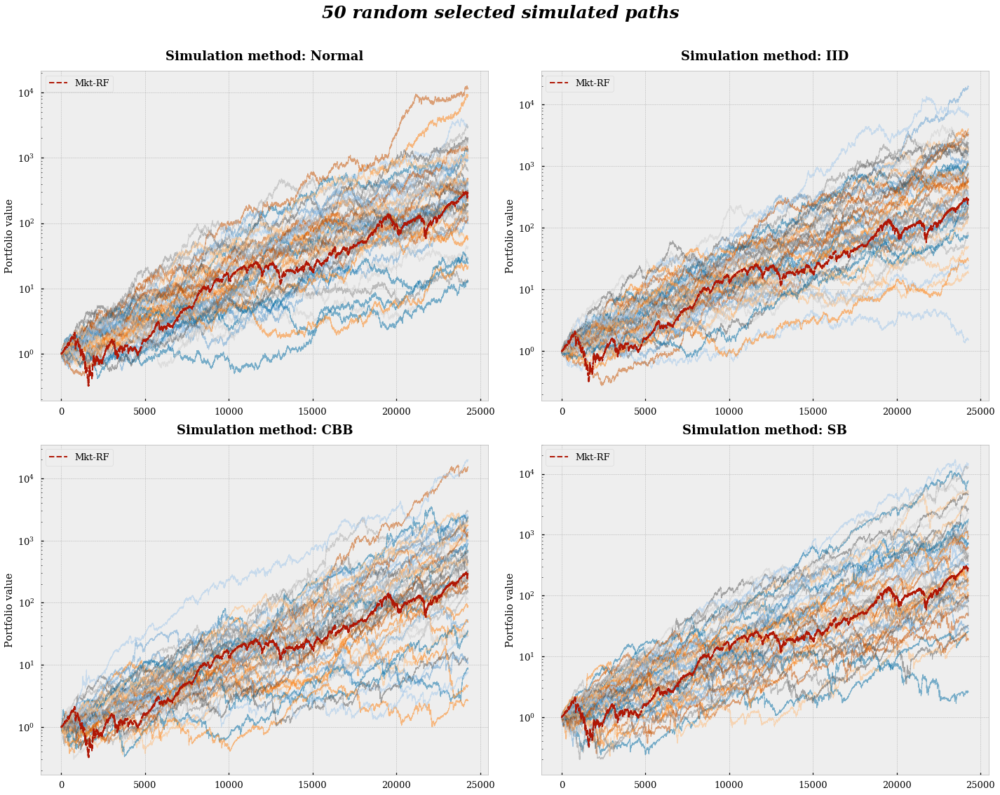

In [29]:
reload(simulation_log_lib)
from simulation_log_lib import *

plt.style.use('tableau-colorblind10')
market_simulation = Simulation(data=df_factors_log.loc[:, ["Mkt-RF"]],
                              n_paths=N_PATHS,
                              blocksize=252,
                              stats=sum_stats,
                              perf_functions=perf_stats_dic,
                              investment_horizon=IH,
                              frequency=FREQUENCY,
                              plotting=PLOT_INTERMEDIATE,
                              store_output=store_output_dic,
                              store_sim=True,
                              add_noise=False)

market_simulation.normal()
market_simulation.iid_bootstrap()
#market_simulation.mbb_bootstrap()
market_simulation.cbb_bootstrap()
market_simulation.sb_bootstrap()
market_simulation.visualize(nr_paths=50)

In [30]:
market_simulation.store_output.keys()

dict_keys(['Mkt-RF'])

<a id='3.2'></a>
## Value (HML) 

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



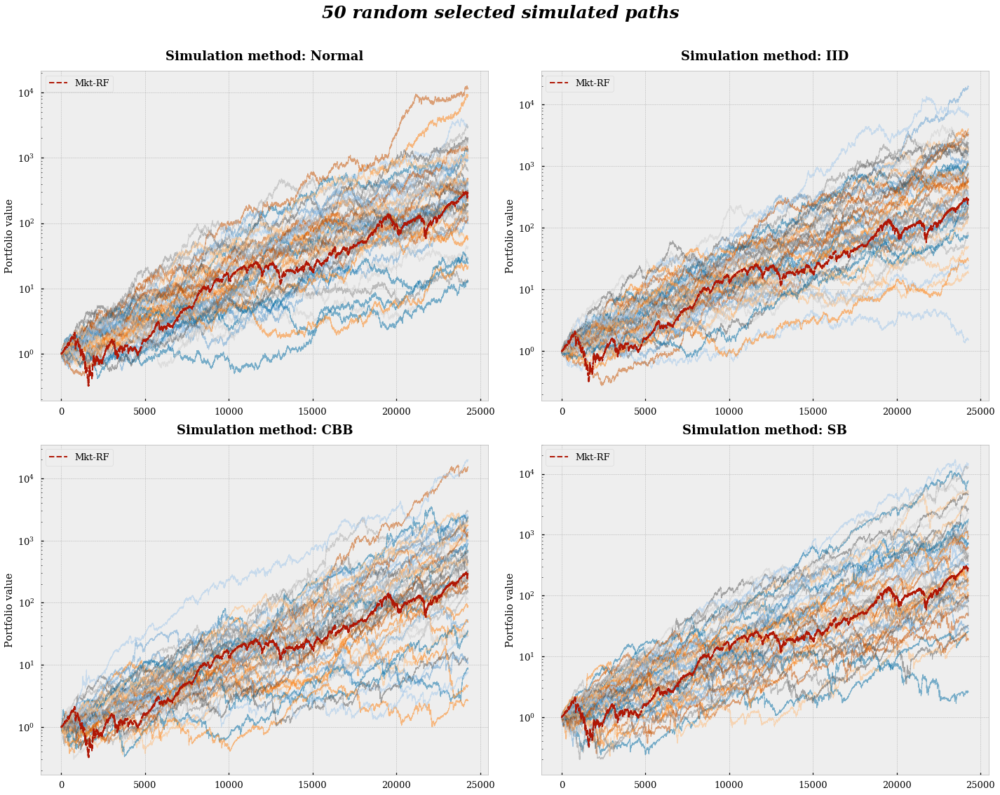

In [31]:
value_simulation = Simulation(data=df_factors_log.loc[:, ["HML"]],
                              n_paths=N_PATHS,
                              blocksize=BLOCKSIZE,
                              stats=sum_stats,
                              perf_functions=perf_stats_dic,
                              investment_horizon=IH,
                              frequency=FREQUENCY,
                              plotting=PLOT_INTERMEDIATE,
                              store_output=store_output_dic,
                              store_sim=False,
                              add_noise=False)

value_simulation.normal()
value_simulation.iid_bootstrap()
#value_simulation.mbb_bootstrap()
value_simulation.cbb_bootstrap()
value_simulation.sb_bootstrap()
market_simulation.visualize(nr_paths=50)

In [32]:
value_simulation.store_output.keys()

dict_keys(['Mkt-RF', 'HML'])

<a id='3.3'></a>
## Momentum (WML) 

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



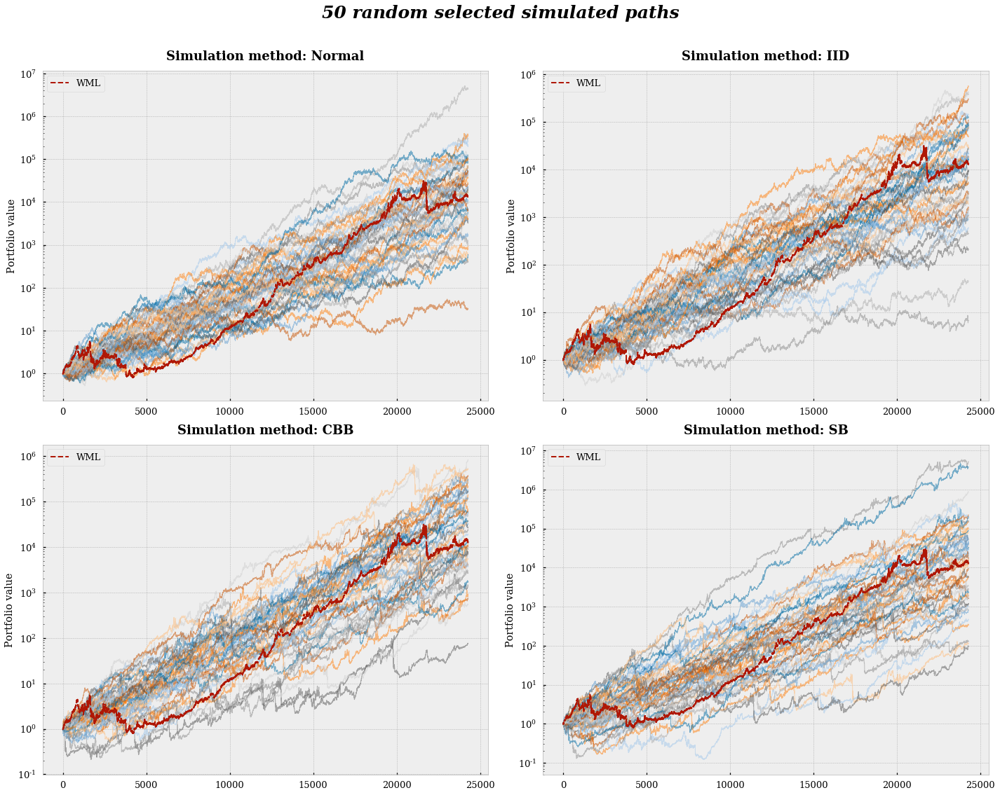

In [33]:
momentum_simulation = Simulation(data=df_factors_log.loc[:, ["WML"]],
                                 n_paths=N_PATHS,
                                 blocksize=BLOCKSIZE,
                                 stats=sum_stats,
                                 perf_functions=perf_stats_dic,
                                 investment_horizon=IH,
                                 frequency=FREQUENCY,
                                 plotting=PLOT_INTERMEDIATE,
                                 store_output=store_output_dic,
                                 store_sim=True,
                                 add_noise=False)

momentum_simulation.normal()
momentum_simulation.iid_bootstrap()
#momentum_simulation.mbb_bootstrap()
momentum_simulation.cbb_bootstrap()
momentum_simulation.sb_bootstrap()
momentum_simulation.visualize(nr_paths=50)

In [34]:
momentum_simulation.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML'])

<a id='3.4'></a>
## 50-50 value-momentum 

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



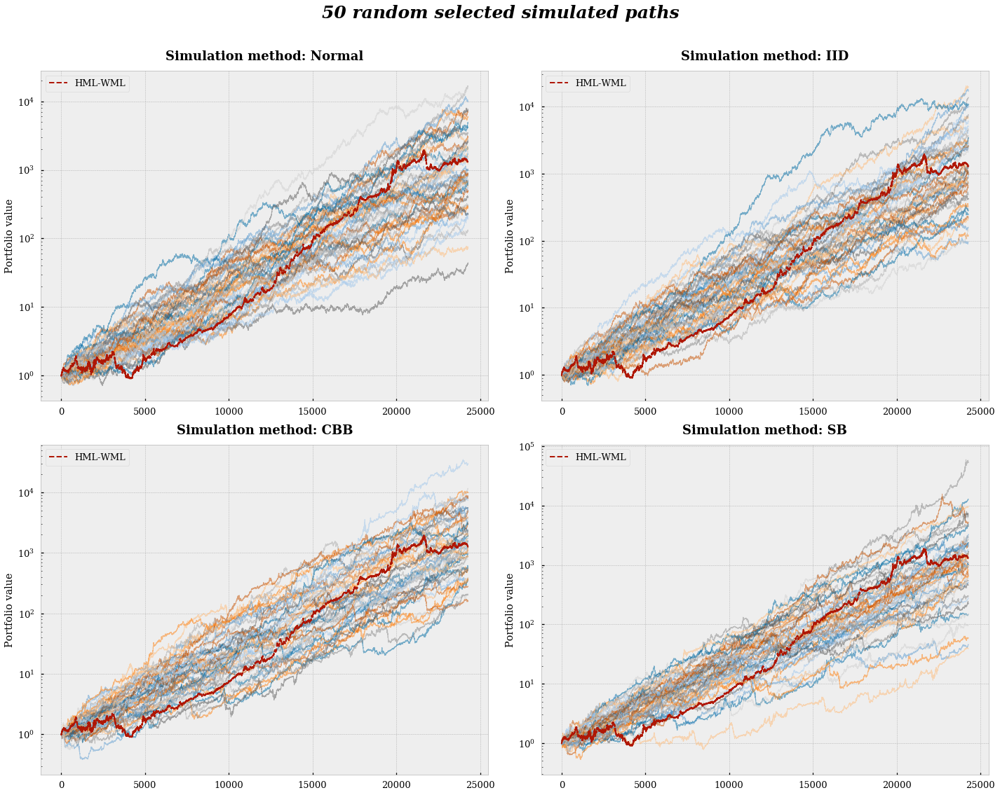

In [35]:
val_mom_simulation = Simulation(data=df_factors_log.loc[:, ["HML-WML"]],
                                n_paths=N_PATHS,
                                blocksize=BLOCKSIZE,
                                stats=sum_stats,
                                perf_functions=perf_stats_dic,
                                investment_horizon=IH,
                                frequency=FREQUENCY,
                                plotting=PLOT_INTERMEDIATE,
                                store_output=store_output_dic,
                                store_sim=True,
                                add_noise=False)

val_mom_simulation.normal()
val_mom_simulation.iid_bootstrap()
#val_mom_simulation.mbb_bootstrap()
val_mom_simulation.cbb_bootstrap()
val_mom_simulation.sb_bootstrap()
val_mom_simulation.visualize(nr_paths=50)

In [36]:
val_mom_simulation.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML', 'HML-WML'])

<a id='3.5'></a>
## summarize results 

I will start by making some figures in order to summarizes the information efficiently. Next, I do the same thing numerically.


**Statistics:**
  
  - geometric return 
  - maximum drawdown
  - number of positive returns (based on the geometric return)

**Portfolios:**

 - Mkt-RF
 - HML
 - WML
 - HML-WML
 
**Simulation methods**

- normal
- iid bootstrapping
- cbb
- sb

**Investment horizons (year)**
- 1, 3, 5, 10, 20, 30

###  Visually

#### 1. Geometric return

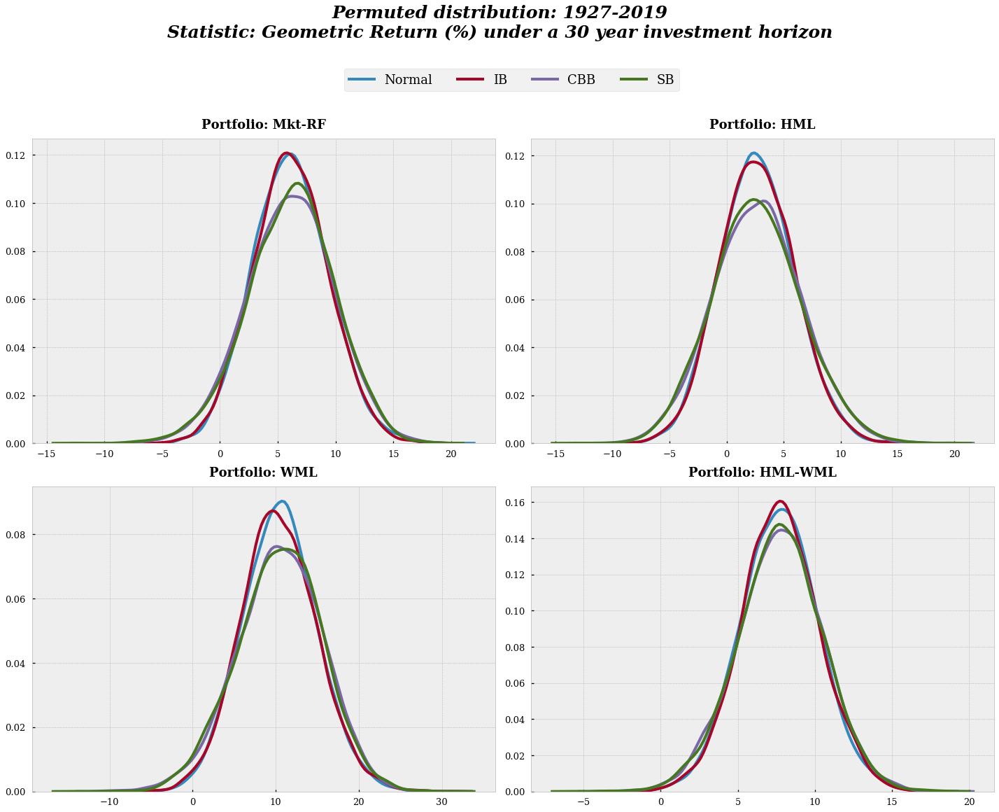

In [37]:
plt.style.use('bmh')
permutation_plot(dic=val_mom_simulation.store_output,
                 investment_h=30,
                 statistic='Geometric Return (%)',
                 period="1927-2019")

#### 2. Maximum Drawdown

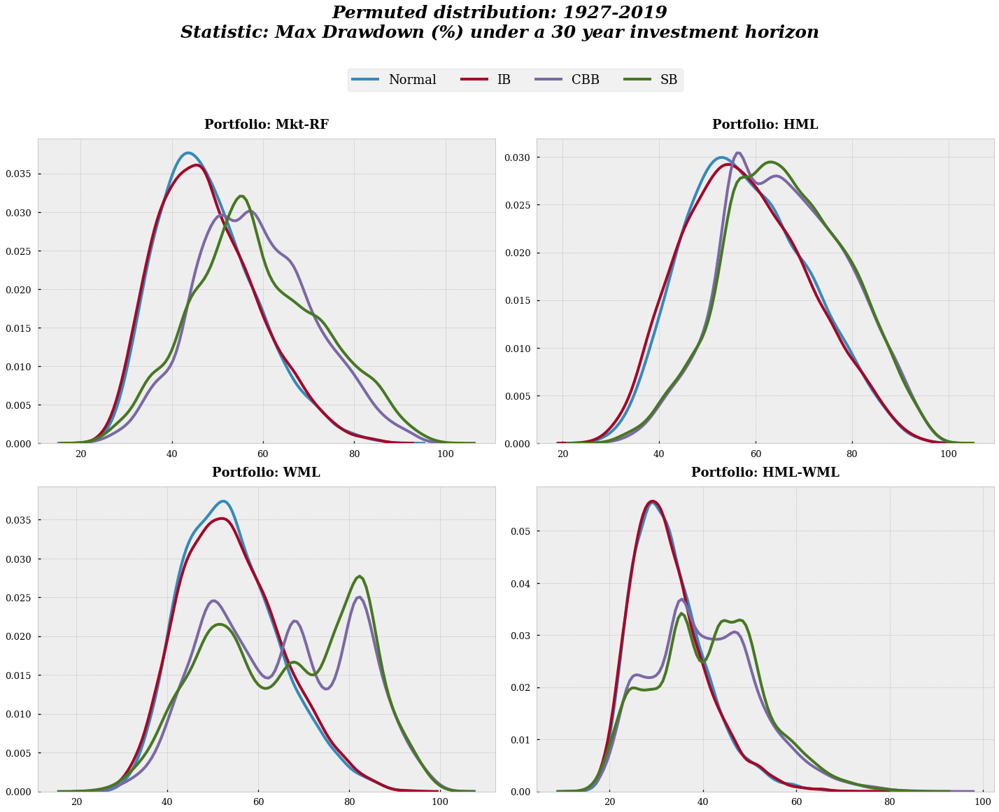

In [38]:
permutation_plot(dic=val_mom_simulation.store_output,
                 investment_h=30,
                 statistic='Max Drawdown (%)',
                 period="1927-2019")

In [39]:
statistic = "Geometric Return (%)"
df_stat = append_stats(stat=statistic, dic=val_mom_simulation.store_output)
df_stat.tail()

above_zero = df_stat.groupby(
    ["Strategy", "Investment Horizon (year)", "Simulation technique"],
    sort=False)[statistic].apply(lambda g: (g < 0).sum()).reset_index(
        name='count')
above_zero.head()

,Strategy,Investment Horizon (year),Simulation technique,count
0,Mkt-RF,1,Normal,3700
1,Mkt-RF,3,Normal,2735
2,Mkt-RF,5,Normal,2176
3,Mkt-RF,10,Normal,1336
4,Mkt-RF,20,Normal,606


#### 3. Positive return for different investment horizon (based on geometric return)

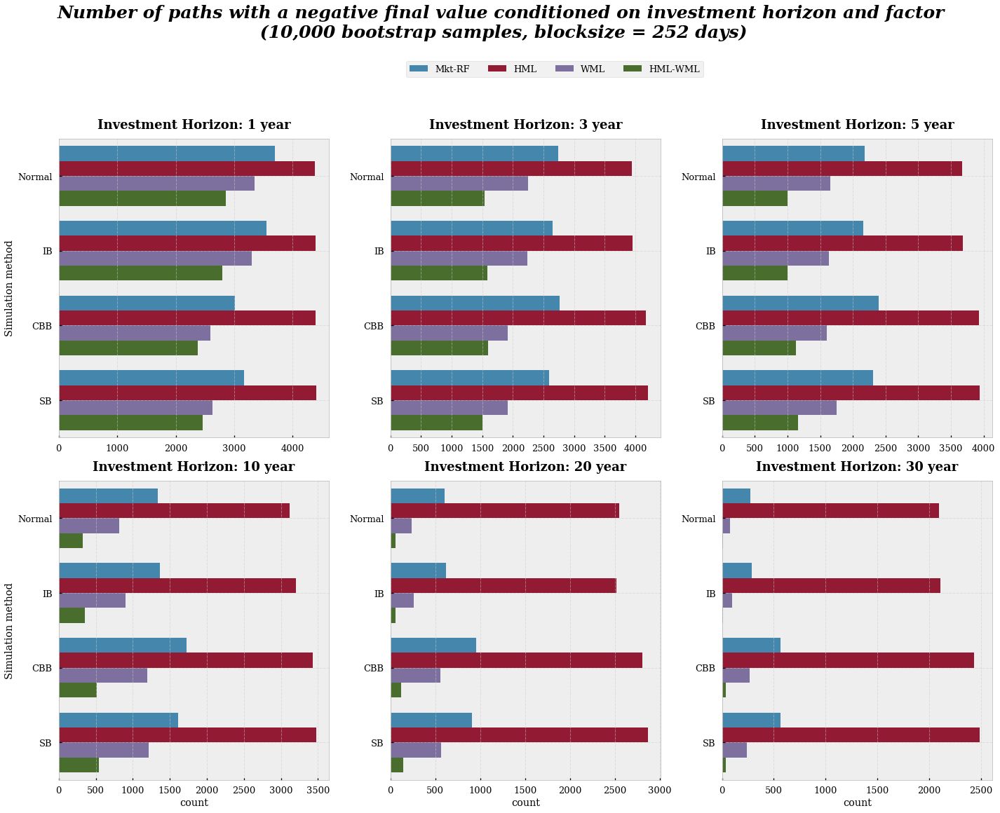

In [40]:
f, axes = plt.subplots(2, 3, figsize=(20, 14))
axes = axes.ravel()
i = 0
for h, h_df in above_zero.groupby("Investment Horizon (year)"):

    sns.barplot(y="Simulation technique",
                x="count",
                hue="Strategy",
                data=h_df,
                ax=axes[i])
    axes[i].get_legend().set_visible(False)  # remove legend
    axes[i].set_ylabel("Simulation method")
    axes[i].set_title(f'Investment Horizon: {h} year',
                      fontsize=18,
                      fontweight="bold",
                      y=1.02)
    axes[i].grid(True, which='major', linestyle='-.', color='0.8')
    i += 1
plt.suptitle(f"Number of paths with a negative\
 final value conditioned on investment horizon and factor\n ({N_PATHS :,}\
 bootstrap samples, blocksize = {BLOCKSIZE} days)",
             y=1.15,
             fontsize=25,
             fontweight="bold",
             style="italic")

# remove unnecessary labels
axes[1].set_ylabel("")
axes[2].set_ylabel("")
axes[4].set_ylabel("")
axes[5].set_ylabel("")
axes[0].set_xlabel("")
axes[1].set_xlabel("")
axes[2].set_xlabel("")
# set legend
plt.tight_layout()
axes[1].legend(bbox_to_anchor=(1.175, 1.275), ncol=4)

# save
# plt.savefig('Positive_Return', bbox_inches='tight')

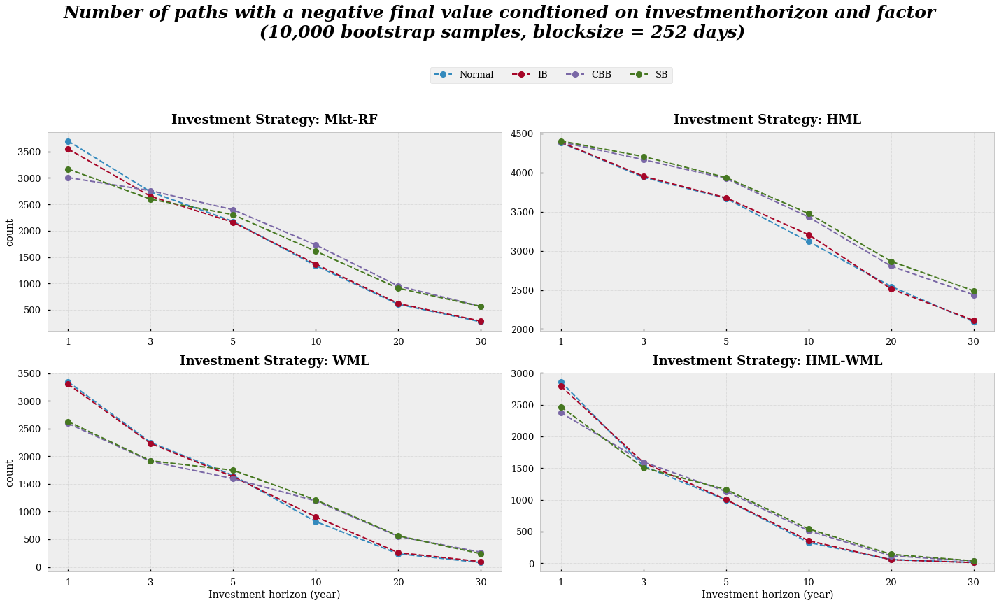

In [41]:
f, axes = plt.subplots(2, 2, figsize=(20, 10))
axes = axes.ravel()
i = 0
x = np.array([1, 2, 3, 4, 5, 6])
for s1, d1 in above_zero.groupby(["Strategy"], sort=False):
    for s2, d2 in d1.groupby("Simulation technique", sort=False):
        axes[i].plot(x, d2["count"], label=s2, linestyle='--', marker='o')

        axes[i].set_title(f'Investment Strategy: {s1}',
            fontsize=18,
                          fontweight="bold",
                          y=1.02)
        axes[i].grid(True, which='major', linestyle='-.', color='0.8')

    axes[i].set_xticklabels(["1", "1", "3", "5", "10", "20", "30"])
    axes[i].set_xlabel("Investment horizon (year)")
    i += 1
axes[0].set_ylabel("count")
axes[0].set_xlabel("")
axes[2].set_ylabel("count")
axes[1].set_xlabel("")

plt.tight_layout()
axes[1].legend(bbox_to_anchor=(.3, 1.35), ncol=4)
plt.suptitle(
    f"Number of paths with a negative final value condtioned on investment\
horizon and factor\n ({N_PATHS :,} bootstrap samples, blocksize = {BLOCKSIZE} days)",
    y=1.2,
    fontsize=25,
    fontweight="bold",
    style="italic");
# save
#plt.savefig('Positive_Return_line', bbox_inches='tight')

###  Numeric Summary Tables

### Mkt-RF
   #### 1. Geometric return

In [42]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="Mkt-RF",
                       statistic="Geometric Return (%)",
                       sim_meth=["Normal", "IB", "CBB", "SB"],
                       nr_neg=True), 2)

Strategy and Statistic*              Mkt-RF : Geometric Return (%)        \
Descriptives                                                 count  mean   
Simulation method Investment Horizon                                       
Normal            1                                        10000.0  7.61   
                  3                                        10000.0  6.59   
                  5                                        10000.0  6.44   
                  10                                       10000.0  6.26   
                  20                                       10000.0  6.16   
                  30                                       10000.0  6.13   
IB                1                                        10000.0  7.78   
                  3                                        10000.0  6.64   
                  5                                        10000.0  6.39   
                  10                                       10000.0  6.24   
                  20                                       10000.0  6.17   
                  30                                       10000.0  6.10   
CBB               1                                        10000.0  7.85   
                  3                                        10000.0  6.64   
                  5                                        10000.0  6.34   
                  10                                       10000.0  6.15   
                  20                                       10000.0  6.11   
                  30                                       10000.0  6.08   
SB                1                                        10000.0  7.74   
                  3                                        10000.0  6.63   
                  5                                        10000.0  6.39   
                  10                                       10000.0  6.20   
                  20                                       10000.0  6.19   
                  30                                       10000.0  6.16   

Strategy and Statistic*                                                    \
Descriptives                            std    min     max kurtosis  skew   
Simulation method Investment Horizon                                        
Normal            1                   18.75 -43.13   94.70     0.47  0.54   
                  3                   10.38 -23.72   57.59     0.29  0.33   
                  5                    8.08 -18.76   44.54     0.15  0.26   
                  10                   5.70 -13.52   33.75     0.02  0.19   
                  20                   4.01  -8.05   23.22     0.08  0.13   
                  30                   3.28  -5.41   20.33     0.01  0.13   
IB                1                   18.35 -42.46   91.32     0.44  0.50   
                  3                   10.56 -29.19   52.94     0.26  0.30   
                  5                    8.10 -21.32   40.69     0.09  0.18   
                  10                   5.70 -13.60   31.12     0.03  0.16   
                  20                   4.01  -8.48   22.42    -0.03  0.07   
                  30                   3.28  -4.92   18.87    -0.02  0.06   
CBB               1                   19.79 -64.11  115.92     1.45 -0.07   
                  3                   11.86 -45.26   49.78     0.23 -0.25   
                  5                    9.24 -34.59   42.43     0.25 -0.19   
                  10                   6.52 -20.04   35.82     0.07 -0.13   
                  20                   4.63 -11.57   21.82    -0.01 -0.11   
                  30                   3.77  -8.90   18.89    -0.00 -0.10   
SB                1                   20.04 -64.06  158.06     1.59  0.15   
                  3                   11.69 -43.06   54.28     0.45 -0.28   
                  5                    9.13 -31.54   42.19     0.32 -0.32   
                  10                   6.43 -21.17   27.61     0.28 -0.30   
                  20  

#### 2. Maximum Drawdown

In [43]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="Mkt-RF",
                       statistic="Max Drawdown (%)",
                       nr_neg=False), 2)

Strategy and Statistic*              Mkt-RF : Max Drawdown (%)                \
Descriptives                                             count   mean    std   
Simulation method Investment Horizon                                           
Normal            1                                    10000.0  16.11   6.23   
                  3                                    10000.0  24.80   8.35   
                  5                                    10000.0  29.57   9.34   
                  10                                   10000.0  36.49  10.34   
                  20                                   10000.0  43.67  10.78   
                  30                                   10000.0  47.85  10.74   
IB                1                                    10000.0  15.42   6.37   
                  3                                    10000.0  24.37   8.72   
                  5                                    10000.0  29.21   9.75   
                  10                                   10000.0  36.15  10.53   
                  20                                   10000.0  43.48  10.95   
                  30                                   10000.0  47.76  10.99   
CBB               1                                    10000.0  15.88  11.12   
                  3                                    10000.0  27.48  13.94   
                  5                                    10000.0  34.25  14.52   
                  10                                   10000.0  43.84  14.48   
                  20                                   10000.0  53.00  13.67   
                  30                                   10000.0  58.15  12.79   
SB                1                                    10000.0  16.27  10.69   
                  3                                    10000.0  27.37  14.13   
                  5                                    10000.0  33.86  15.14   
                  10                                   10000.0  43.44  15.62   
                  20                                   10000.0  53.15  14.98   
                  30                                   10000.0  58.57  14.21   

Strategy and Statistic*                                                   \
Descriptives                            min    max kurtosis  skew    1 %   
Simulation method Investment Horizon                                       
Normal            1                    4.71  45.87     0.82  0.93   6.54   
                  3                    7.06  64.35     0.63  0.85  11.29   
                  5                   10.70  68.89     0.34  0.76  14.26   
                  10                  15.01  78.31     0.34  0.74  19.10   
                  20                  19.18  89.88     0.18  0.64  24.60   
                  30                  22.21  89.88     0.03  0.55  28.58   
IB                1                    3.69  49.47     0.92  0.98   5.79   
                  3                    8.02  65.96     0.73  0.88  10.63   
                  5                    9.72  74.40     0.68  0.86  13.49   
                  10                  13.20  83.99     0.33  0.71  18.12   
                  20                  19.04  87.30     0.11  0.62  24.40   
                  30                  22.65  87.30    -0.09  0.51  28.16   
CBB               1                    2.85  65.68     2.19  1.53   3.17   
                  3                    5.87  84.11     0.11  0.79   7.73   
                  5                    6.63  89.68    -0.13  0.58  10.53   
                  10                   8.86  92.26    -0.33  0.37  16.57   
                  20                  15.55  95.11    -0.31  0.22  25.48   
                  30                  21.61  97.15    -0.30  0.21  31.23   
SB                1                    2.43  65.68     1.68  1.38   3.55   
                  3                    5.32  82.27     0.47  0.94   7.89   
                  5                    6.92  87.16     0.09  0.75  10.44   
               

### HML
   #### 1. Geometric return

In [44]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="HML",
                       statistic="Geometric Return (%)",
                       nr_neg=True), 2)

Strategy and Statistic*              HML : Geometric Return (%)               \
Descriptives                                              count  mean    std   
Simulation method Investment Horizon                                           
Normal            1                                     10000.0  4.31  18.71   
                  3                                     10000.0  3.25  10.50   
                  5                                     10000.0  3.04   8.11   
                  10                                    10000.0  2.82   5.64   
                  20                                    10000.0  2.70   3.99   
                  30                                    10000.0  2.68   3.27   
IB                1                                     10000.0  4.24  18.66   
                  3                                     10000.0  3.30  10.65   
                  5                                     10000.0  3.07   8.23   
                  10                                    10000.0  2.88   5.77   
                  20                                    10000.0  2.77   4.07   
                  30                                    10000.0  2.70   3.30   
CBB               1                                     10000.0  5.10  22.24   
                  3                                     10000.0  3.36  12.61   
                  5                                     10000.0  3.02   9.75   
                  10                                    10000.0  2.91   6.86   
                  20                                    10000.0  2.82   4.80   
                  30                                    10000.0  2.74   3.90   
SB                1                                     10000.0  4.96  22.39   
                  3                                     10000.0  3.34  12.67   
                  5                                     10000.0  3.01   9.71   
                  10                                    10000.0  2.84   6.83   
                  20                                    10000.0  2.75   4.82   
                  30                                    10000.0  2.69   3.93   

Strategy and Statistic*                                                      \
Descriptives                            min     max kurtosis  skew # neg. R   
Simulation method Investment Horizon                                          
Normal            1                  -47.12  148.15     0.69  0.55   4384.0   
                  3                  -28.80   51.82     0.05  0.26   3941.0   
                  5                  -23.66   35.91    -0.07  0.18   3672.0   
                  10                 -15.91   24.18     0.03  0.13   3119.0   
                  20                 -11.62   19.68     0.00  0.10   2545.0   
                  30                 -11.59   15.27    -0.04  0.09   2093.0   
IB                1                  -42.65   98.71     0.51  0.55   4389.0   
                  3                  -29.87   51.07     0.23  0.34   3954.0   
                  5                  -25.26   44.56     0.30  0.30   3679.0   
                  10                 -16.35   25.83     0.03  0.20   3207.0   
                  20                 -13.12   22.93     0.09  0.15   2514.0   
                  30                  -9.08   16.25     0.06  0.12   2110.0   
CBB               1                  -59.03  137.62     1.84  0.82   4392.0   
                  3                  -37.53   60.66     0.41  0.38   4166.0   
                  5                  -30.10   47.61     0.29  0.27   3925.0   
                  10                 -22.89   31.89     0.14  0.17   3433.0   
                  20                 -14.24   23.78     0.06  0.13   2805.0   
                  30                  -9.89   19.69    -0.00  0.09   2437.0   
SB                1                  -58.59  191.24     3.46  1.00   4405.0   
                  3                  -34.43   67.63     0.64  0.48   4206.0   
                  5   

#### 2. Maximum Drawdown

In [45]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="HML",
                       statistic="Max Drawdown (%)",
                       nr_neg=False), 2)

Strategy and Statistic*              HML : Max Drawdown (%)                \
Descriptives                                          count   mean    std   
Simulation method Investment Horizon                                        
Normal            1                                 10000.0  17.68   6.80   
                  3                                 10000.0  28.14   9.50   
                  5                                 10000.0  34.02  10.67   
                  10                                10000.0  43.13  12.00   
                  20                                10000.0  52.87  12.65   
                  30                                10000.0  58.42  12.59   
IB                1                                 10000.0  17.14   6.94   
                  3                                 10000.0  27.62   9.56   
                  5                                 10000.0  33.59  10.75   
                  10                                10000.0  42.65  12.08   
                  20                                10000.0  52.30  12.79   
                  30                                10000.0  58.00  12.84   
CBB               1                                 10000.0  17.78  10.81   
                  3                                 10000.0  31.38  13.31   
                  5                                 10000.0  39.02  13.94   
                  10                                10000.0  49.77  14.00   
                  20                                10000.0  60.28  13.23   
                  30                                10000.0  66.26  12.58   
SB                1                                 10000.0  17.88  10.11   
                  3                                 10000.0  30.80  13.36   
                  5                                 10000.0  38.41  14.20   
                  10                                10000.0  49.23  14.30   
                  20                                10000.0  60.25  13.37   
                  30                                10000.0  66.32  12.62   

Strategy and Statistic*                                                   \
Descriptives                            min    max kurtosis  skew    1 %   
Simulation method Investment Horizon                                       
Normal            1                    3.82  52.71     0.54  0.85   7.03   
                  3                    8.42  68.35     0.22  0.73  12.68   
                  5                   11.24  76.60    -0.01  0.64  16.11   
                  10                  16.92  85.12    -0.20  0.51  22.04   
                  20                  21.89  93.44    -0.39  0.36  29.15   
                  30                  25.27  98.06    -0.51  0.27  34.11   
IB                1                    3.70  49.80     0.53  0.85   6.25   
                  3                    7.61  67.97     0.27  0.71  11.80   
                  5                    9.65  79.47     0.17  0.66  15.47   
                  10                  15.16  85.78    -0.23  0.51  21.34   
                  20                  20.46  94.57    -0.44  0.35  28.49   
                  30                  25.68  95.45    -0.51  0.25  33.12   
CBB               1                    3.24  59.12     1.84  1.35   3.67   
                  3                    6.25  80.71    -0.38  0.57  10.13   
                  5                    9.60  86.45    -0.55  0.32  14.27   
                  10                  13.67  95.11    -0.46  0.15  21.63   
                  20                  18.61  96.54    -0.44  0.10  32.42   
                  30                  30.02  98.11    -0.55  0.06  39.12   
SB                1                    1.91  63.70     1.69  1.26   3.81   
                  3                    5.58  75.76    -0.38  0.60   9.01   
                  5                    8.12  82.05    -0.70  0.34  13.69   
                  10                  14.73  92.80    -0.60  0.09  20.96   
                  20

### WML
   #### 1. Geometric return

In [46]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="WML",
                       statistic="Geometric Return (%)",
                       nr_neg=True), 2)

Strategy and Statistic*              WML : Geometric Return (%)                \
Descriptives                                              count   mean    std   
Simulation method Investment Horizon                                            
Normal            1                                     10000.0  13.23  25.90   
                  3                                     10000.0  11.21  14.47   
                  5                                     10000.0  10.85  11.10   
                  10                                    10000.0  10.74   7.97   
                  20                                    10000.0  10.57   5.56   
                  30                                    10000.0  10.48   4.48   
IB                1                                     10000.0  12.84  25.29   
                  3                                     10000.0  11.27  14.53   
                  5                                     10000.0  10.94  11.20   
                  10                                    10000.0  10.56   7.95   
                  20                                    10000.0  10.47   5.63   
                  30                                    10000.0  10.40   4.57   
CBB               1                                     10000.0  13.47  25.23   
                  3                                     10000.0  11.46  15.58   
                  5                                     10000.0  11.14  12.28   
                  10                                    10000.0  10.70   8.85   
                  20                                    10000.0  10.60   6.33   
                  30                                    10000.0  10.47   5.18   
SB                1                                     10000.0  13.93  26.37   
                  3                                     10000.0  11.53  15.80   
                  5                                     10000.0  11.03  12.62   
                  10                                    10000.0  10.67   8.95   
                  20                                    10000.0  10.52   6.31   
                  30                                    10000.0  10.45   5.15   

Strategy and Statistic*                                                      \
Descriptives                            min     max kurtosis  skew # neg. R   
Simulation method Investment Horizon                                          
Normal            1                  -52.61  167.27     0.91  0.68   3348.0   
                  3                  -32.40   78.06     0.16  0.37   2252.0   
                  5                  -24.97   53.24     0.07  0.27   1655.0   
                  10                 -14.46   49.56     0.12  0.24    820.0   
                  20                  -8.25   33.38    -0.02  0.17    238.0   
                  30                  -6.86   31.31     0.11  0.10     78.0   
IB                1                  -53.99  146.03     0.66  0.61   3306.0   
                  3                  -35.07   71.87     0.23  0.34   2234.0   
                  5                  -27.42   56.69     0.09  0.24   1632.0   
                  10                 -17.65   50.09     0.03  0.18    906.0   
                  20                  -7.76   35.30     0.08  0.19    259.0   
                  30                  -5.88   31.28     0.17  0.16     95.0   
CBB               1                  -80.19  135.61     1.23 -0.09   2596.0   
                  3                  -59.10   68.81     0.96 -0.44   1911.0   
                  5                  -45.62   54.01     0.64 -0.43   1597.0   
                  10                 -25.80   48.39     0.21 -0.30   1193.0   
                  20                 -18.63   31.82     0.12 -0.25    553.0   
                  30                 -11.28   29.13     0.11 -0.21    266.0   
SB                1                  -80.19  157.31     1.42  0.05   2630.0   
                  3                  -62.93   83.25     0.91 -0.29   1920.

#### 2. Maximum Drawdown

In [47]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="WML",
                       statistic="Max Drawdown (%)",
                       nr_neg=False), 2)

Strategy and Statistic*              WML : Max Drawdown (%)                \
Descriptives                                          count   mean    std   
Simulation method Investment Horizon                                        
Normal            1                                 10000.0  19.96   7.46   
                  3                                 10000.0  30.07   9.57   
                  5                                 10000.0  35.41  10.41   
                  10                                10000.0  42.44  11.06   
                  20                                10000.0  49.86  10.94   
                  30                                10000.0  53.92  10.64   
IB                1                                 10000.0  19.18   8.07   
                  3                                 10000.0  29.38  10.26   
                  5                                 10000.0  34.80  10.98   
                  10                                10000.0  42.52  11.54   
                  20                                10000.0  50.07  11.39   
                  30                                10000.0  54.19  11.04   
CBB               1                                 10000.0  19.34  13.28   
                  3                                 10000.0  32.12  16.18   
                  5                                 10000.0  38.93  16.83   
                  10                                10000.0  49.17  17.18   
                  20                                10000.0  59.18  16.64   
                  30                                10000.0  65.18  15.76   
SB                1                                 10000.0  19.86  13.23   
                  3                                 10000.0  32.08  16.32   
                  5                                 10000.0  38.99  17.52   
                  10                                10000.0  49.01  18.22   
                  20                                10000.0  59.62  17.42   
                  30                                10000.0  65.75  16.35   

Strategy and Statistic*                                                   \
Descriptives                            min    max kurtosis  skew    1 %   
Simulation method Investment Horizon                                       
Normal            1                    5.51  53.36     0.64  0.86   8.40   
                  3                   10.52  69.98     0.34  0.77  14.36   
                  5                   13.69  78.71     0.38  0.74  18.08   
                  10                  16.95  88.46     0.28  0.69  23.33   
                  20                  24.28  91.56     0.02  0.54  29.90   
                  30                  27.64  92.14    -0.07  0.48  34.13   
IB                1                    4.06  58.22     0.76  0.91   6.79   
                  3                    8.11  74.90     0.46  0.80  12.61   
                  5                   11.71  81.84     0.37  0.75  16.52   
                  10                  12.99  87.05     0.10  0.61  22.21   
                  20                  21.38  91.33    -0.15  0.48  29.35   
                  30                  26.25  93.83    -0.20  0.40  32.99   
CBB               1                    3.07  82.33     4.28  1.82   4.93   
                  3                    5.18  95.08     1.35  1.19   9.90   
                  5                    7.45  96.73     0.53  0.95  13.62   
                  10                  12.74  97.23    -0.37  0.64  20.81   
                  20                  21.24  99.47    -0.96  0.31  30.24   
                  30                  27.15  99.47    -1.11  0.03  35.17   
SB                1                    3.07  84.59     4.28  1.79   4.93   
                  3                    5.06  97.08     1.40  1.24   9.95   
                  5                    7.73  97.37     0.41  0.98  13.12   
                  10                  12.74  97.84    -0.58  0.59  20.08   
                  20

### HML-WML
   #### 1. Geometric return

In [48]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="HML-WML",
                       statistic="Geometric Return (%)",
                       nr_neg=True), 2)

Strategy and Statistic*              HML-WML : Geometric Return (%)        \
Descriptives                                                  count  mean   
Simulation method Investment Horizon                                        
Normal            1                                         10000.0  8.37   
                  3                                         10000.0  8.02   
                  5                                         10000.0  7.85   
                  10                                        10000.0  7.80   
                  20                                        10000.0  7.74   
                  30                                        10000.0  7.72   
IB                1                                         10000.0  8.68   
                  3                                         10000.0  7.98   
                  5                                         10000.0  7.82   
                  10                                        10000.0  7.77   
                  20                                        10000.0  7.77   
                  30                                        10000.0  7.75   
CBB               1                                         10000.0  8.52   
                  3                                         10000.0  8.03   
                  5                                         10000.0  7.91   
                  10                                        10000.0  7.78   
                  20                                        10000.0  7.76   
                  30                                        10000.0  7.74   
SB                1                                         10000.0  8.70   
                  3                                         10000.0  8.02   
                  5                                         10000.0  7.87   
                  10                                        10000.0  7.81   
                  20                                        10000.0  7.77   
                  30                                        10000.0  7.74   

Strategy and Statistic*                                                    \
Descriptives                            std    min     max kurtosis  skew   
Simulation method Investment Horizon                                        
Normal            1                   13.78 -38.20   70.52     0.28  0.40   
                  3                    7.95 -21.67   46.51     0.20  0.26   
                  5                    6.21 -15.18   33.58     0.08  0.17   
                  10                   4.34  -7.89   24.47     0.02  0.12   
                  20                   3.11  -4.91   20.19     0.16  0.14   
                  30                   2.54  -1.16   17.93     0.11  0.05   
IB                1                   13.95 -31.11   75.93     0.31  0.39   
                  3                    7.98 -17.38   41.65     0.07  0.22   
                  5                    6.23 -12.83   33.77     0.11  0.20   
                  10                   4.40  -7.94   29.05     0.06  0.12   
                  20                   3.06  -2.89   20.93     0.11  0.07   
                  30                   2.53  -2.74   18.00     0.11  0.03   
CBB               1                   15.25 -46.86   87.78     2.28  0.18   
                  3                    8.78 -29.14   55.99     0.84 -0.04   
                  5                    6.74 -20.59   38.49     0.36 -0.07   
                  10                   4.75 -12.19   27.47     0.19 -0.08   
                  20                   3.39  -5.86   20.72     0.09 -0.03   
                  30                   2.78  -3.91   18.91     0.11 -0.08   
SB                1                   15.36 -49.80  100.59     2.14  0.33   
                  3                    8.69 -27.35   51.47     1.07 -0.02   
                  5                    6.70 -18.14   41.22     0.54 -0.09   
                  10                   4.81 -12.74   27.65     0.28 -0.0

#### 2. Maximum Drawdown

In [49]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="HML-WML",
                       statistic="Max Drawdown (%)",
                       nr_neg=False), 2)

Strategy and Statistic*              HML-WML : Max Drawdown (%)                \
Descriptives                                              count   mean    std   
Simulation method Investment Horizon                                            
Normal            1                                     10000.0  11.64   4.48   
                  3                                     10000.0  17.51   6.06   
                  5                                     10000.0  20.73   6.72   
                  10                                    10000.0  25.27   7.39   
                  20                                    10000.0  30.04   7.77   
                  30                                    10000.0  32.82   7.84   
IB                1                                     10000.0  11.18   4.72   
                  3                                     10000.0  17.32   6.31   
                  5                                     10000.0  20.61   6.93   
                  10                                    10000.0  25.29   7.68   
                  20                                    10000.0  29.89   7.94   
                  30                                    10000.0  32.67   7.96   
CBB               1                                     10000.0  11.51   7.87   
                  3                                     10000.0  19.15   9.76   
                  5                                     10000.0  23.41  10.45   
                  10                                    10000.0  29.60  11.35   
                  20                                    10000.0  36.27  11.62   
                  30                                    10000.0  40.38  11.45   
SB                1                                     10000.0  11.54   7.42   
                  3                                     10000.0  18.87   9.87   
                  5                                     10000.0  23.08  10.91   
                  10                                    10000.0  29.51  11.98   
                  20                                    10000.0  36.68  12.15   
                  30                                    10000.0  41.12  11.68   

Strategy and Statistic*                                                   \
Descriptives                            min    max kurtosis  skew    1 %   
Simulation method Investment Horizon                                       
Normal            1                    2.95  38.85     1.15  0.99   4.77   
                  3                    5.69  52.87     1.29  1.03   8.15   
                  5                    7.50  61.05     1.33  1.01  10.15   
                  10                  10.08  64.14     1.16  0.96  13.45   
                  20                  13.29  77.59     0.96  0.86  16.97   
                  30                  14.18  77.59     1.00  0.88  19.84   
IB                1                    2.64  35.82     1.22  1.04   4.11   
                  3                    5.06  47.59     1.07  1.00   7.70   
                  5                    6.75  55.00     0.95  0.94   9.75   
                  10                   9.63  63.30     1.00  0.91  12.80   
                  20                  13.25  68.51     1.18  0.95  16.78   
                  30                  14.69  76.01     1.05  0.89  19.17   
CBB               1                    1.90  47.72     4.08  1.81   2.46   
                  3                    3.10  67.01     1.74  1.30   5.49   
                  5                    4.97  75.98     1.01  1.12   8.18   
                  10                   8.14  81.57     0.32  0.87  12.69   
                  20                  13.53  85.89    -0.03  0.57  17.67   
                  30                  14.64  92.13     0.07  0.46  20.47   
SB                1                    1.48  49.73     4.10  1.76   2.90   
                  3                    3.20  64.60     1.64  1.32   5.06   
                  5                    4.97  69.24     0.78  1.1

There is a clear distinction between the distributions depending on the simulation assumptions:

 - the normal and i.i.d. bootstrap are similar
 - and the circular block bootstrap and stationary bootstrap are more alike
 
IMO the circular and stationary bootstrap givs a far more  realistic picture about expectations, since they (try to) preserve the non-normality and serial correlations. One limitation of the circular block bootstrap is the fixed block size. Different block sizes emphasize different periods or lengths of autocorrelation (memory). At the extremes you can take a block size so small (i.i.d. bootstrap) that no serial correlation is captured, and at the other end you could take a block size so large that you end up sampling the original series. However, in my initial experimentation there are many reasonable block sizes that generate realistic price paths, that overall capture the behavior of the original series. I guess this is also why results of the circular block bootstrap are very close to those obtained from the stationary bootstrap. 


**Geometric Return** 

Perhaps most interesting are the **frequencies of negative returns (# neg. R) for different factors under a investment horizon ranging from 1 year to 30 years**.
When evaluating portfolio performance, professional investors often put much weight on three or five years of past returns. The message from the results above is that chance is a big player in outcomes for these horizons. In the simulations, the expected premiums are more or less equal to their sample averages. Negative simulated premiums are then just chance results of high return volatility. By definition the variance will shrink as you increase the investor horizon, the question remains how fast?

As an example, **For a five-year investment horizon**, the estimated probabilities that a **value strategy** delivers a negative premium on a purely chance basis are substantial, ranging between 20-26% depending on the simulation assumptions. The estimated frequencies of negative premiums are bigger at shorter investment horiozns, even though we know that, by construction, the expected premiums are positive and large. For longer investment horizons the negative premium becomes less likely but still substantial for 10-year periods and they are also nontrivial for 20-year periods. 

**Maximum Drawdown**

 
The main message when looking at drawdowns is two-fold. First, it shows that value of and momentum strategies like the market also suffers large drawdowns. Moreover, if we falsely view returns as being well approximated by independent normal distributions, you would severely underestimate the magnitude of the worst likely drawdowns. Second,  if we account for the serial correlation structures, the observed large drawdowns are not that surprising at all. 

<a id='Chapter4'></a>
# Chapter: 4 Simulation Analysis Part 2

## Recent poor performance of the Momentum and Value factor 

The figure below shows that value and momentum factor did not deliver much return
in the **last 15 years (01-01-2004 to 28-02-2019)**. Are these factors broken or just experiencing a period of bad luck? To answer this question, I examine the role of bad luck in explaining the recent poor performance of factors. I start with measuring the performance of each factor over the last 15 years
ending February 2019 and use simulations to assess the likelihood of observing this level of
performance, given how the factors performed before these recent years. I compare factor performance from **January 2004** through **February 2019** to performance from:
 - **July 1963 through December 2003**. 
 - **January 1927 through December 2003**
 
Similar as in Chapter 3, I then simulate returns under different assumptions to assess which features of factor returns, if any, can account for their poor recent performance. Some Papers **only include data starting from 1963** because they argue that the period before is not representative anymore due to higher volatility. Therefore, I will analyze both periods separately and look whether there are notable differences. **The number of simulations is set at 10,000. and the blocksize and mean blocksize are both 252 days**. Finally, the bootstrap samples where I calculate the statistic of interest on are based on an investment horizon of 15 years.


### Helper functions
 - `p_values:`calculates the p-values
 - `p_table:`appends the p-values for different statistics , investment horizons, 
    strategies and simulation methods in a table

### Performance over the last recent 15 years

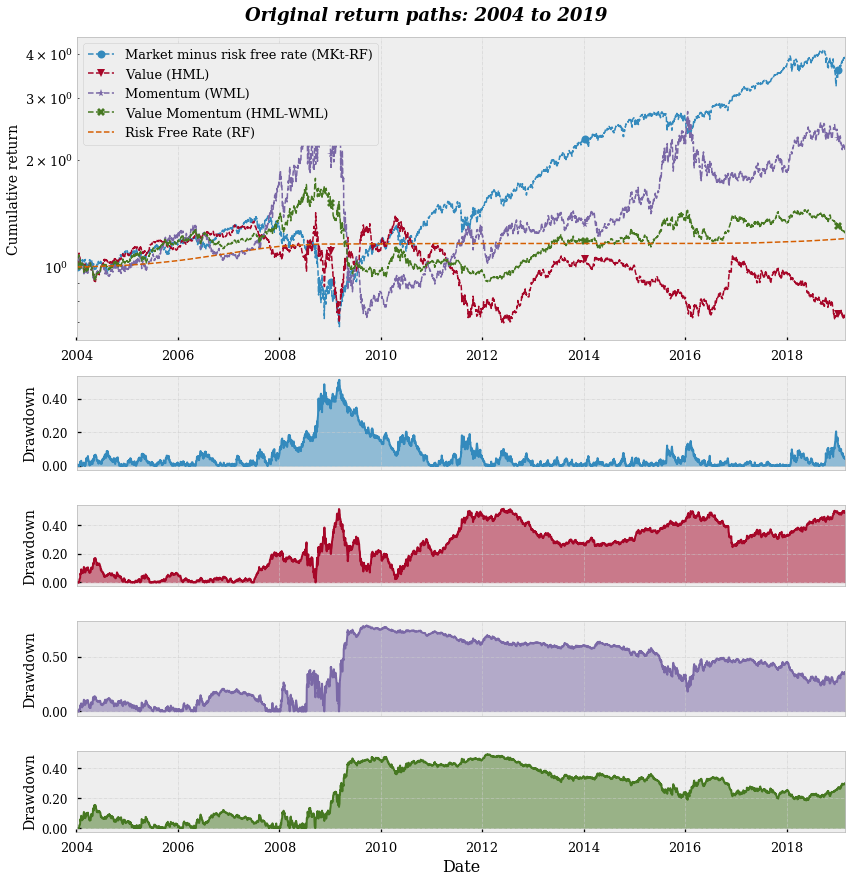

In [50]:
start = datetime.date(year=2004, month=1, day=1)
df_15 = df_factors.loc[start:]
Return_DD(df=df_15, dic_labels=dic_fac, time_frequency=FREQUENCY)

In [51]:
round(perf_stat(df=df_factors_log.iloc[:,:4],dic_perf=perf_stats_dic,
                rf = pd.DataFrame(df_factors_log.iloc[:,4]) ,all_stats=True), 3)

,Mkt-RF,HML,WML,HML-WML
Skew,-0.419,0.303,-1.424,-0.318
Kurtosis,17.414,12.775,36.073,25.629
Terminal Wealth Relative,290.565,11.163,13062.719,1273.726
Arithmetric Return (%),5.890,2.593,9.836,7.421
Geometric Return (%),6.067,2.627,10.336,7.703
Excess Arithmetric Return (%),2.757,-0.540,6.704,4.288
Excess Geometric Return (%),2.796,-0.538,6.933,4.382
Arithmetric Volatility (%),16.938,17.721,22.405,12.867
Geometric Volatility (%),18.457,19.388,25.114,13.732
Arithmetric SR,0.348,0.146,0.439,0.577


In [52]:
print(round(df_15.describe(), 3))
obs_15 = round(perf_stat(df=df_15.iloc[:,:4], all_stats=True, 
                rf = pd.DataFrame(df_15.iloc[:,4]),dic_perf=perf_stats_dic), 3)
obs_15

         Mkt-RF       HML       WML   HML-WML        RF
count  3815.000  3815.000  3815.000  3815.000  3815.000
mean      0.036    -0.009     0.021     0.006     0.005
std       1.160     1.130     1.871     0.785     0.006
min      -8.950    -7.710   -20.750    -7.205     0.000
25%      -0.410    -0.510    -0.680    -0.375     0.000
50%       0.070    -0.030     0.100     0.030     0.001
75%       0.540     0.470     0.830     0.430     0.008
max      11.350     9.470    14.180     5.930     0.022


,Mkt-RF,HML,WML,HML-WML
Skew,-0.176,0.283,-1.197,-0.588
Kurtosis,10.640,8.038,16.739,6.632
Terminal Wealth Relative,2.898,-0.283,1.214,0.260
Arithmetric Return (%),8.986,-2.194,5.251,1.529
Geometric Return (%),9.402,-2.170,5.392,1.541
Excess Arithmetric Return (%),7.767,-3.412,4.033,0.310
Excess Geometric Return (%),8.077,-3.355,4.115,0.311
Arithmetric Volatility (%),18.407,17.929,29.699,12.455
Geometric Volatility (%),20.210,19.636,34.580,13.264
Arithmetric SR,0.488,-0.122,0.177,0.123


### Performance  before the last 15 years starting from 1963

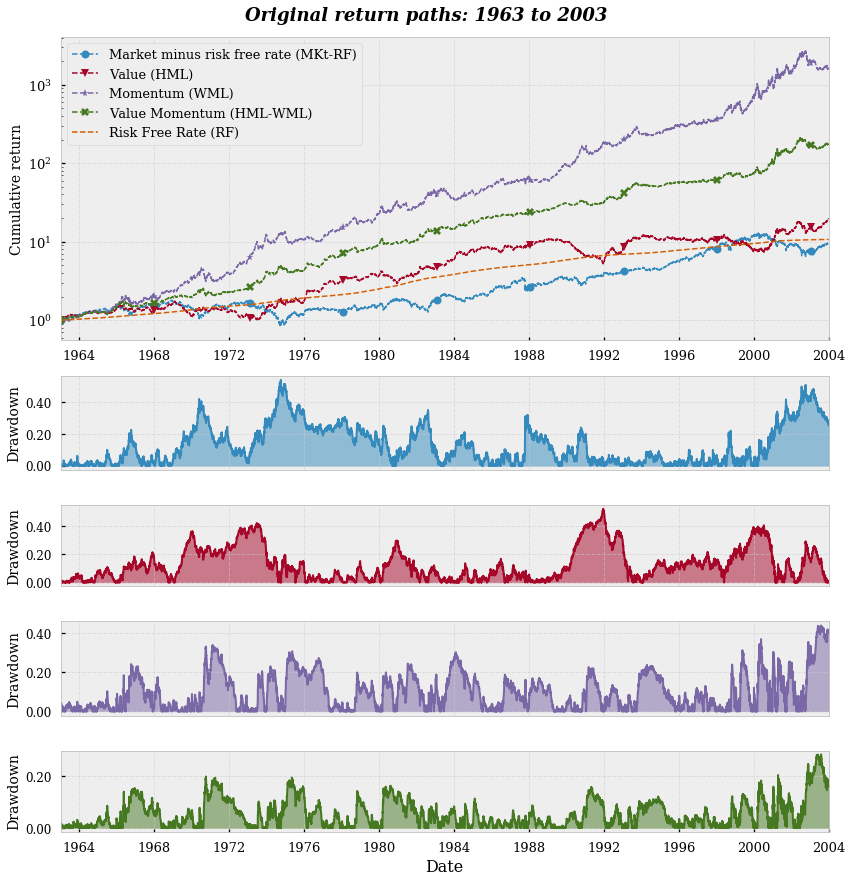

In [53]:
start, end = datetime.date(year=1963, month=1, day=1), datetime.date(year=2004,
                                                                     month=1,
                                                                     day=1)
df_before_15_63 = df_factors.loc[start:end]
Return_DD(df=df_before_15_63, dic_labels=dic_fac, time_frequency=FREQUENCY)

### Performance  before the last 15 years starting from 1927 (all data)

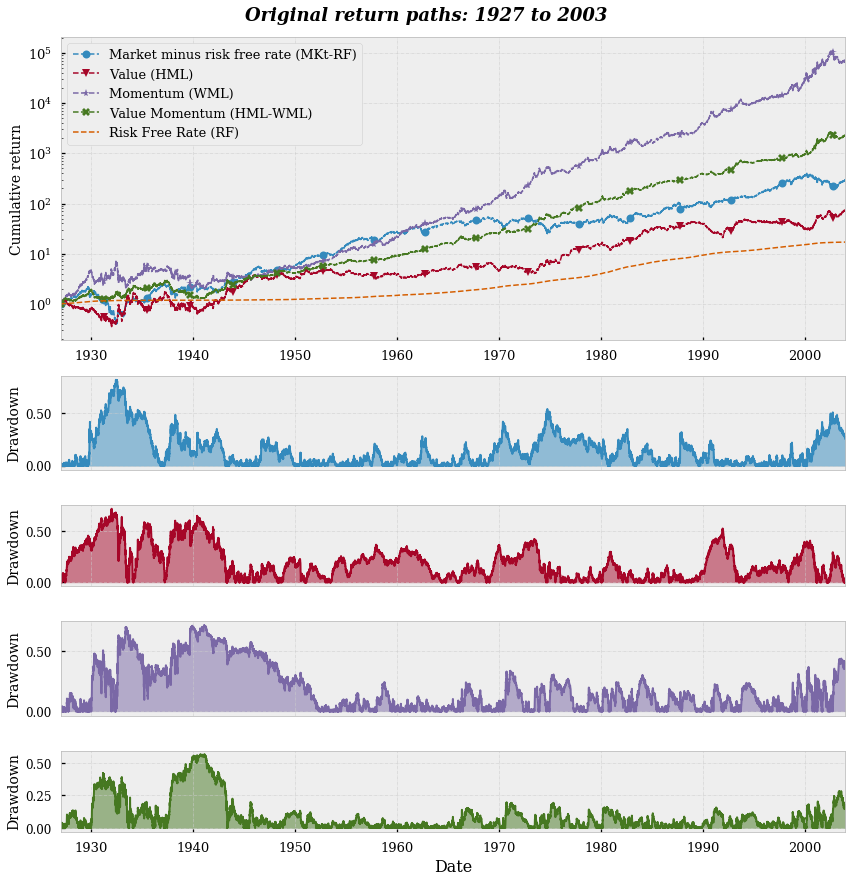

In [54]:
start, end = datetime.date(year=1927, month=1, day=1), datetime.date(year=2004,
                                                                     month=1,
                                                                     day=1)
df_before_15_27 = df_factors.loc[start:end]
Return_DD(df=df_before_15_27, dic_labels=dic_fac,time_frequency=FREQUENCY)

In [55]:
perf_stats_dic.keys()

dict_keys(['Skew', 'Kurtosis', 'Terminal Wealth Relative', 'Arithmetric Return (%)', 'Geometric Return (%)', 'Excess Arithmetric Return (%)', 'Excess Geometric Return (%)', 'Arithmetric Volatility (%)', 'Geometric Volatility (%)', 'Arithmetric SR', 'Geometric SR', 'Max Drawdown (%)', 'Max time in DD (Year)', 'Underwater (%)', '(%) Underwater >20 %'])

In [56]:
sum_stats = ['Geometric Return (%)', 'Max Drawdown (%)', 'Geometric SR']
investment_horizon = [15]  # in years
# store all the output in a dictionary
store_output_dic_63, store_output_dic_27 = {}, {}

<a id='4.1'></a>
## Simulation Period: 01-01-1963 till 31-12-2003 

<a id='4.1.1'></a>
###  Market 

In [57]:
market_simulation_15_63 = Simulation(data=df_before_15_63.loc[:, ["Mkt-RF"]],
                                     n_paths=N_PATHS,
                                     blocksize=BLOCKSIZE,
                                     stats=sum_stats,
                                     perf_functions=perf_stats_dic,
                                     investment_horizon=investment_horizon,
                                     frequency=FREQUENCY,
                                     plotting=PLOT_INTERMEDIATE,
                                     store_output=store_output_dic_63,
                                     store_sim=False)

market_simulation_15_63.normal()
market_simulation_15_63.iid_bootstrap()
market_simulation_15_63.cbb_bootstrap()
market_simulation_15_63.sb_bootstrap()

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



In [58]:
market_simulation_15_63.store_output.keys()

dict_keys(['Mkt-RF'])

<a id='4.1.2'></a>
### Value (HML) 

In [59]:
value_simulation_15_63 = Simulation(data=df_before_15_63.loc[:, ["HML"]],
                                     n_paths=N_PATHS,
                                     blocksize=BLOCKSIZE,
                                     stats=sum_stats,
                                     perf_functions=perf_stats_dic,
                                     investment_horizon=investment_horizon,
                                     frequency=FREQUENCY,
                                     plotting=PLOT_INTERMEDIATE,
                                     store_output=store_output_dic_63,
                                     add_noise=False)

value_simulation_15_63.normal()
value_simulation_15_63.iid_bootstrap()
value_simulation_15_63.cbb_bootstrap()
value_simulation_15_63.sb_bootstrap()

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



In [60]:
value_simulation_15_63.store_output.keys()

dict_keys(['Mkt-RF', 'HML'])

<a id='4.1.3'></a>
###  Momentum (WML) 

In [61]:
momentum_simulation_15_63 = Simulation(data=df_before_15_63.loc[:, ["WML"]],
                                       n_paths=N_PATHS,
                                       blocksize=BLOCKSIZE,
                                       stats=sum_stats,
                                       perf_functions=perf_stats_dic,
                                       investment_horizon=investment_horizon,
                                       frequency=FREQUENCY,
                                       plotting=PLOT_INTERMEDIATE,
                                       store_output=store_output_dic_63,
                                       add_noise=False)

momentum_simulation_15_63.normal()
momentum_simulation_15_63.iid_bootstrap()
momentum_simulation_15_63.cbb_bootstrap()
momentum_simulation_15_63.sb_bootstrap()

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



In [62]:
momentum_simulation_15_63.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML'])

<a id='4.1.3'></a>
### Value-Momentum (HML-WML) 

In [63]:
val_mom_simulation_15_63 = Simulation(data=df_before_15_63.loc[:, ["HML-WML"]],
                                      n_paths=N_PATHS,
                                      blocksize=BLOCKSIZE,
                                      stats=sum_stats,
                                      perf_functions=perf_stats_dic,
                                      investment_horizon=investment_horizon,
                                      frequency=FREQUENCY,
                                      plotting=PLOT_INTERMEDIATE,
                                      store_output=store_output_dic_63,
                                      add_noise=False)

val_mom_simulation_15_63.normal()
val_mom_simulation_15_63.iid_bootstrap()
val_mom_simulation_15_63.cbb_bootstrap()
val_mom_simulation_15_63.sb_bootstrap()

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



In [64]:
val_mom_simulation_15_63.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML', 'HML-WML'])

<a id='4.2'></a>
## Simulation Period: 01-01-1927 till 31-12-2003 

<a id='4.2.1'></a>
### Market (Mkt-RF) 

In [65]:
market_simulation_15_27 = Simulation(data=df_before_15_27.loc[:, ["Mkt-RF"]],
                                     n_paths=N_PATHS,
                                     blocksize=BLOCKSIZE,
                                     stats=sum_stats,
                                     perf_functions=perf_stats_dic,
                                     investment_horizon=investment_horizon,
                                     frequency=FREQUENCY,
                                     plotting=PLOT_INTERMEDIATE,
                                     store_output=store_output_dic_27,
                                     add_noise=False)

market_simulation_15_27.normal()
market_simulation_15_27.iid_bootstrap()
market_simulation_15_27.cbb_bootstrap()
market_simulation_15_27.sb_bootstrap()

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



In [66]:
market_simulation_15_27.store_output.keys()

dict_keys(['Mkt-RF'])

<a id='4.2.2'></a>
###  Value (HML) 

In [67]:
value_simulation_15_27 = Simulation(data=df_before_15_27.loc[:, ["HML"]],
                                    n_paths=N_PATHS,
                                    blocksize=BLOCKSIZE,
                                    stats=sum_stats,
                                    perf_functions=perf_stats_dic,
                                    investment_horizon=investment_horizon,
                                    frequency=FREQUENCY,
                                    plotting=PLOT_INTERMEDIATE,
                                    store_output=store_output_dic_27,
                                    add_noise=False)

value_simulation_15_27.normal()
value_simulation_15_27.iid_bootstrap()
value_simulation_15_27.cbb_bootstrap()
value_simulation_15_27.sb_bootstrap()

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



In [68]:
value_simulation_15_27.store_output.keys()

dict_keys(['Mkt-RF', 'HML'])

<a id='4.2.3'></a>
### Momentum (WML) 

In [69]:
momentum_simulation_15_27 = Simulation(data=df_before_15_27.loc[:, ["WML"]],
                                       n_paths=N_PATHS,
                                       blocksize=BLOCKSIZE,
                                       stats=sum_stats,
                                       perf_functions=perf_stats_dic,
                                       investment_horizon=investment_horizon,
                                       frequency=FREQUENCY,
                                       plotting=PLOT_INTERMEDIATE,
                                       store_output=store_output_dic_27,
                                       add_noise=False)

momentum_simulation_15_27.normal()
momentum_simulation_15_27.iid_bootstrap()
momentum_simulation_15_27.cbb_bootstrap()
momentum_simulation_15_27.sb_bootstrap()

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



In [70]:
momentum_simulation_15_27.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML'])

<a id='4.2.4'></a>
### Value-Momentum (HML-WML) 

In [71]:
val_mom_simulation_15_27 = Simulation(data=df_before_15_27.loc[:, ["HML-WML"]],
                                      n_paths=N_PATHS,
                                      blocksize=BLOCKSIZE,
                                      stats=sum_stats,
                                      perf_functions=perf_stats_dic,
                                      investment_horizon=investment_horizon,
                                      frequency=FREQUENCY,
                                      plotting=PLOT_INTERMEDIATE,
                                      store_output=store_output_dic_27,
                                      add_noise=False)

val_mom_simulation_15_27.normal()
val_mom_simulation_15_27.iid_bootstrap()
val_mom_simulation_15_27.cbb_bootstrap()
val_mom_simulation_15_27.sb_bootstrap()

NORMAL 


IID BOOTSTRAP 


CIRCULAR BOOTSTRAP 


STATIONARY BOOTSTRAP 



In [72]:
val_mom_simulation_15_27.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML', 'HML-WML'])

 <a id='4.3'></a>
## Summarize results

<a id='4.3.1'></a>
### Simulation Period: 01-01-1963 till 31-12-2003 

In [73]:
sum_stats

['Geometric Return (%)', 'Max Drawdown (%)', 'Geometric SR']

In [74]:
statistic = 'Geometric Return (%)'  # could choose any of the statistic above
dic_output_63 = val_mom_simulation_15_63.store_output
df_stat_63 = append_stats(stat=statistic, dic=dic_output_63)
df_stat_63.head()

,Geometric Return (%),Strategy,Simulation technique,Investment Horizon (year)
0,9.407689,Mkt-RF,Normal,15
1,14.354338,Mkt-RF,Normal,15
2,0.736997,Mkt-RF,Normal,15
3,0.621432,Mkt-RF,Normal,15
4,4.639667,Mkt-RF,Normal,15


#### Geometric Return

In [75]:
# observed performance over the last 15 years
perf_stat(df=df_15, stats=["Geometric Return (%)"], dic_perf=perf_stats_dic)

,Mkt-RF,HML,WML,HML-WML,RF
Geometric Return (%),9.402252,-2.169802,5.391707,1.540591,1.226105


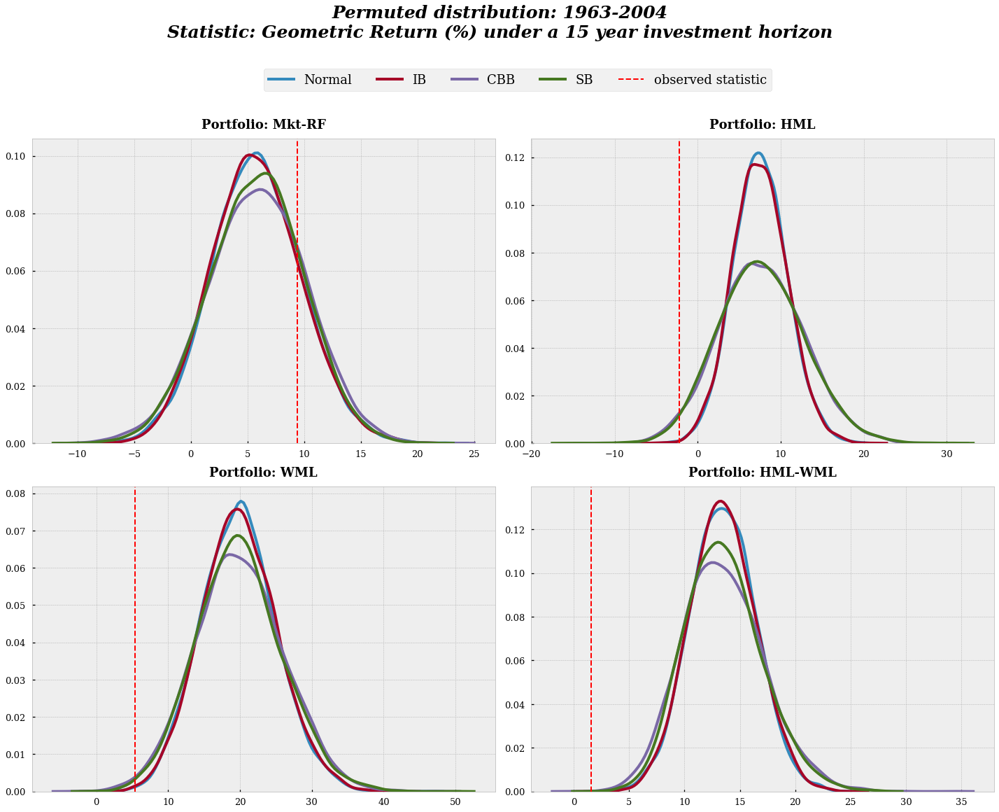

In [76]:
obs_T = perf_stat(df=df_15, stats=["Geometric Return (%)"],dic_perf=perf_stats_dic).values.tolist()[0]
permutation_plot(dic=val_mom_simulation_15_63.store_output,
                 investment_h=15,
                 statistic='Geometric Return (%)',
                 period="1963-2004",
                 obs_stats=obs_T)

#### Maximum Drawdown

In [77]:
# observed maximum dd over the last 15 years
perf_stat(df=df_15, stats=["Max Drawdown (%)"],dic_perf=perf_stats_dic)

,Mkt-RF,HML,WML,HML-WML,RF
Max Drawdown (%),51.222449,51.124796,78.508228,48.913505,0.0


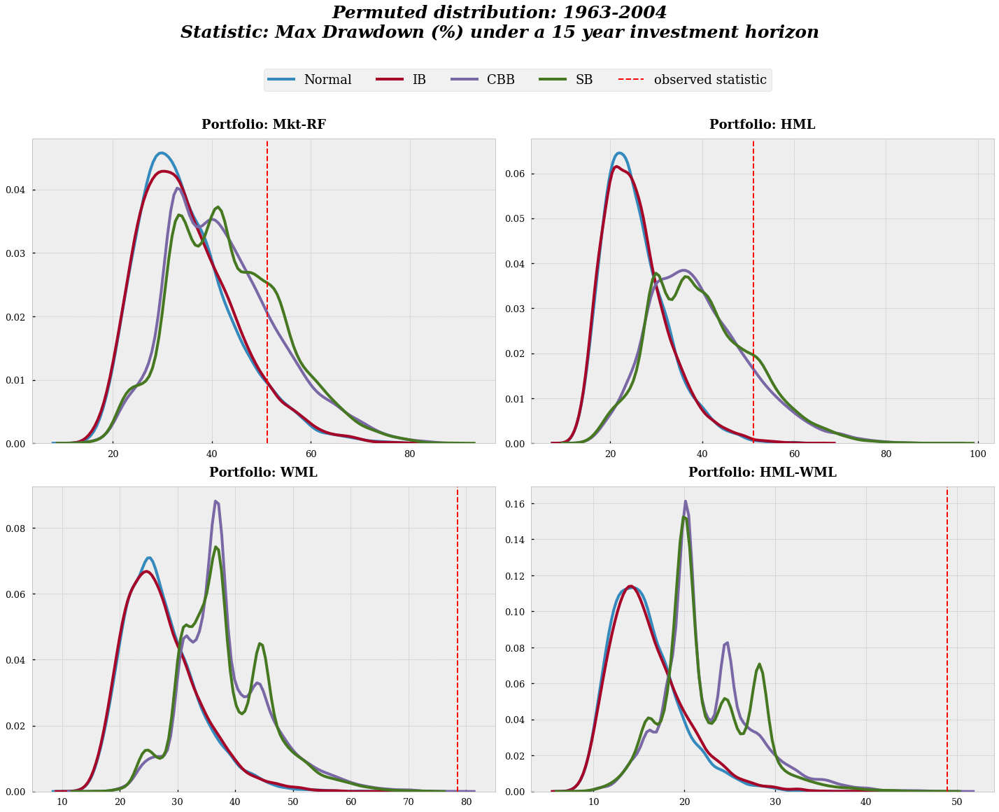

In [78]:
obs_T = perf_stat(df=df_15, stats=["Max Drawdown (%)"],dic_perf=perf_stats_dic).values.tolist()[0]
permutation_plot(dic=val_mom_simulation_15_63.store_output,
                 investment_h=15,
                 statistic='Max Drawdown (%)',
                 period="1963-2004",
                 obs_stats=obs_T)

### Numeric Summary Table: 01-01-1963 till 31-12-2003

The table below shows the number of returns paths with a more extreme statistic (more to the left except for drawdown this is right). The number of simulations was set at 10,000. 

In [79]:
p_table(stat=sum_stats,
        dic=val_mom_simulation_15_63.store_output,
        observed=df_15, 
        perf_stats_dic=perf_stats_dic)

Performance statistic*     Geometric Return (%) Max Drawdown (%) Geometric SR
Portfolio Simulatin Method                                                   
Mkt-RF    Normal                           8153              675         6408
          IB                               8208              681         6442
          CBB                              7856             2035         5985
          SB                               8056             2343         6099
HML       Normal                             11               26           22
          IB                                  9               36           19
          CBB                               242             1456          373
          SB                                206             1715          322
WML       Normal                             16                0            3
          IB                                 18                0            4
          CBB                                77                0           20
          SB                                 47                0            4
HML-WML   Normal                              0                0            0
          IB                                  0                0            0
          CBB                                 1                1            1
          SB                                  0                0            0

**Observations regarding the geometric return**

Below I describe my observations for the **annualized geometric return**, similar conclusions hold for other performance statistics (except maybe for maximum drawdown)

The permuted distributions excludes the 15-year period ending 28 February 2019 from the analysis in creating
the 10,000 simulated histories of factor returns. If an investor uses these data to calibrate
expectations about performance over the next 15 years, **how probable would the actual
observed geometric annual returns seem?**

As in chapter 3, I use a blocksize of 126 for the circular block bootstrap and the average blocksize for the stationary bootstrap is also set at 126 days. The p-value associated with the observed  returns are very low except for the market portfolio. Relative to the powerful returns from before 2004, the recent performance of the value, momentum and the value-momentum strategies over the past 15 years is unexpectedly low. There certainly are differences between the different simulation methods, though the main conclusion does not change.

<a id='4.3.2'></a>
### Simulation Period: 01-01-1927 till 31-12-2003 

#### Geometric return

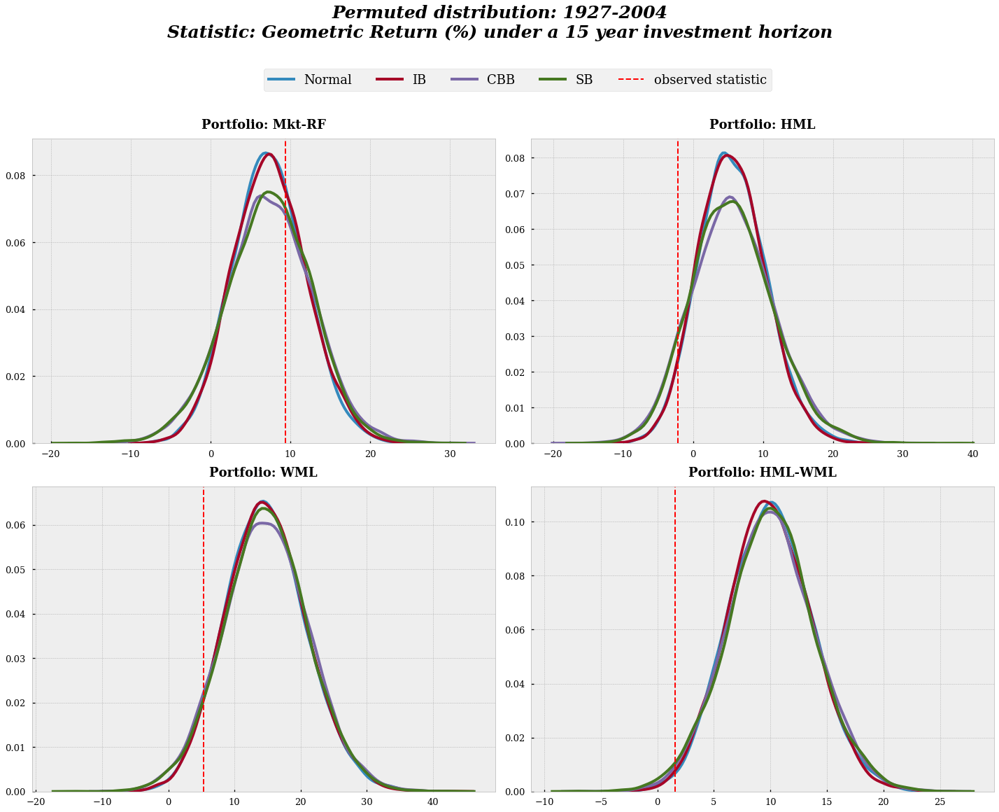

In [80]:
obs_T = perf_stat(df=df_15, stats=["Geometric Return (%)"],dic_perf=perf_stats_dic).values.tolist()[0]
permutation_plot(dic=val_mom_simulation_15_27.store_output,
                 investment_h=15,
                 statistic='Geometric Return (%)',
                 period="1927-2004",
                 obs_stats=obs_T)

####  Maximum Drawdown

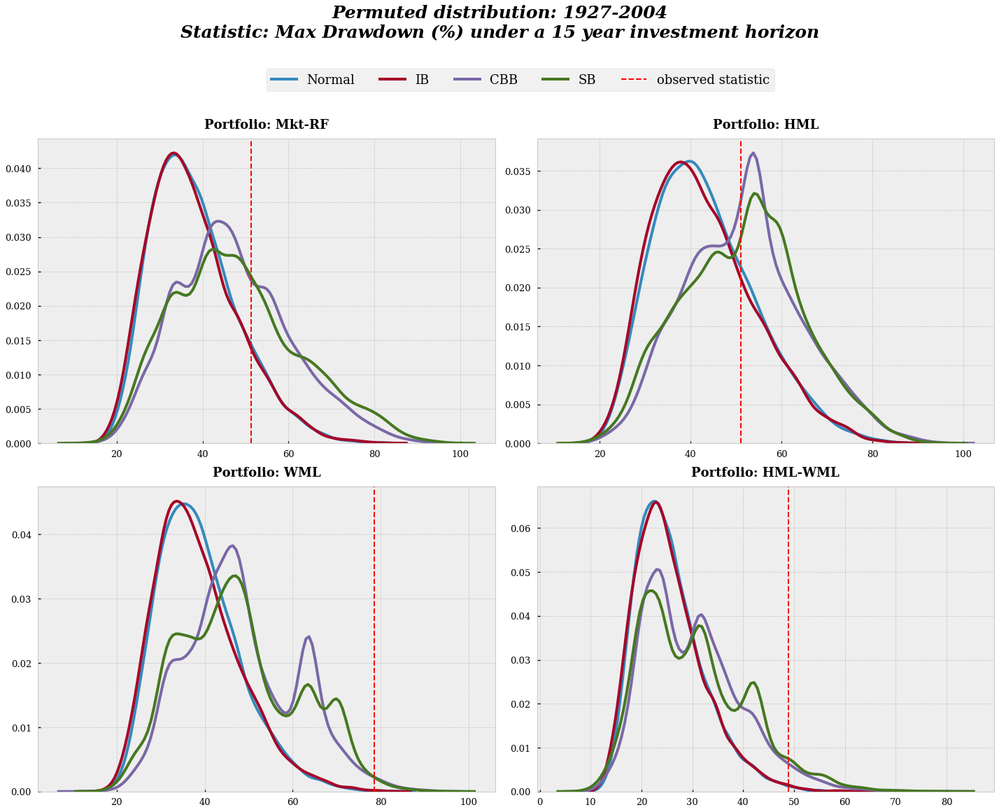

In [81]:
obs_T = perf_stat(df=df_15, stats=["Max Drawdown (%)"],dic_perf=perf_stats_dic).values.tolist()[0]
permutation_plot(dic=val_mom_simulation_15_27.store_output,
                 investment_h=15,
                 statistic="Max Drawdown (%)",
                 period="1927-2004",
                 obs_stats=obs_T)

### Numeric Summary Table: 01-01-1927 till 31-12-2003

The table below shows the number of returns paths with a more extreme statistic (more to to left except for drawdown this is right). The number of simulations was set at 10,000. 

In [82]:
p_table(stat=sum_stats,
        dic=val_mom_simulation_15_27.store_output,
        observed=df_15,
        perf_stats_dic=perf_stats_dic)

Performance statistic*     Geometric Return (%) Max Drawdown (%) Geometric SR
Portfolio Simulatin Method                                                   
Mkt-RF    Normal                           6791             1090         5984
          IB                               6699             1074         5890
          CBB                              6485             3467         5597
          SB                               6475             3651         5425
HML       Normal                            462             2361          471
          IB                                457             2245          467
          CBB                               880             5220          904
          SB                                845             5291          869
WML       Normal                            593                4          268
          IB                                566                4          281
          CBB                               742              104          475
          SB                                701               85          478
HML-WML   Normal                             79               40           82
          IB                                 82               48           88
          CBB                               123              370          138
          SB                                171              548          199

**Observations regarding the geometric return**

I repeat the excercise from above, but when constructing the permuted distribution I use all data starting from 01-01-1927 till 31-12-2003. All other parameters are kept the same as before. Looking at the p-values in the table above, the probability of observing the performance for various statisitcs over the last 15 years increases,  but stays rather low. This is certainly the case for the value-momentum strategy.

<a id='Chapter5'></a>
# Chapter 5: Conclusion and discussion


**Investment horizon matters**
 - The probabilities that premiums are negative on a purely chance basis are substantial for the 1-year, 3-year, 5-year and 10-year periods. Chance is big player in outcomes for these horizons.
 - Some differences between the simulation methods, though the main message does not change
 - Deciding on the (mean) block size is not trivial, but there are many reasonable (mean) block sizes that generate realistic price paths, that overall capture the behavior of the original series.
 - Any study such as this suffers from survivor bias: the US stock market was one of the most successful investment choices an investor could have made when looking back. As a result, we are probably underestimating/overestimating depending on the statistic.
 
**Recent past performance of value, momentum and a 50-50 value-momentum strategies are unexpectedly low**

It is no secret that value and momentum strategies have recently fallen far short of investor expectations. Is this a case of the factors being broken or have they just been unlucky over the last 15 years? The answer is probably a combination of both. Recent factor performance has been uncharacteristically bad given pre-2004 performance. Value (HML), momentum (WML) and 50-50 value-momentum (HML-WML) pre-2004 returns were likely inflated due to data mining and selection bias, and their post 2004 returns were likely depressed by crowding  as the factors gained widespread adoption. In contrary, the performance of the market portfolio (Mkt-RF) over the last 15 years is in line with historical expectations.

<a id='Chapter6'></a>
# Chapter 6: Limitations

**Assumptions being made**


- all data over the whole sample is representative: contrary to other people I do think that data from 1927 is still useful. I believe  events like the crash in 1930 can happen again (actually the magnitude of 2007 was close to 1930).
  
- the sampled blocks are iid
 
- stationarity: I think this is a really important assumption I make and I have my concerns. Markets are dynamic not statistics, we act like the distribution does not change over time why in reality it probably does change. I think, looking at hidden markov models, might be a interesting idea for further research.
 
- there are clear volatility regimes: these have clear impact on our bootstrap results. What are the implications?
 
- drawdown is a question mark for me
 
- survivorship bias: the US stock market was one of the best investment choices an investor could have made. Therefore results in Chapter 3 are probably underestimated (in the negative sense) and are not generalizable to other countries. Furthermore, even in the US, very few investment firms outperform (on various statistics) the portfolios considered in this study (even before slippage and transactions costs).
 
- I do not account for slippage and transaction cost. Slippage is the difference between where the computer signaled the entry and exit for a trade and where actual clients with actual money, entered and exited the market using the computers signals. By definition you would never have had the same price as the historical reported price since you would have moved the price most likely against you. There are however clever ways to minimize this cost. I do not think this is a problem for Chapter 4 as long as you compare apples with apples.

- I assume an investor reinvest his money (no withdrawals), this may not be realistic in reality

- other important assumptions?

<a id='Chapter7'></a>
# Chapter 7: Questions


1. Some general comments on the analysis: 

      - thoughts, suggestions, thing I should pay attention to...


2. Normally when bootstrapping the distribution of the statistic(s) of interest you use all data you have. However, since I am interested in the distribution of the statistic for a specific investment horizon, I condition on the bootstrap length. Is this problematic and what are the consequences? 

3. Regarding maximum drawdown, can I bootstrap such a statistic? I read some arguments about being careful when bootstrapping extrema statistics  **(https://stats.stackexchange.com/questions/119748/using-bootstrap-to-obtain-sampling-distribution-of-1st-percentile) and [here](http://www.stat.rutgers.edu/home/mxie/stat586/handout/Bootstrap1.pdf)**. For WML and WML-HML, you get a bivariate distribution. I assume this has to do with the volatility regimes?

4. These volatility regimes have a clear impact on our bootstrap results. What are the implications?
5. What are the assumptions being made regarding the block bootstrap (cbb and sb): 
  
    - for example we assume these blocks are iid 
    - how reasonable are these approaches considered for this problem and under what circumstances are they not appropriate? 


6. Regarding the stationary bootstrap: when is this bootstrap method more appropriate compared to the circular block bootstrap?
8. I also looked at the moving block bootstrap, but got very similar result to the circular and stationary block bootstrap. I would like to have a better understanding what assumptions I have made and which bootstraps methods are most appropriate in what circumstances. Regarding the block size, several rules have been suggested when choosing the block the block length. So far I have found several reasonable block sizes that seem to generate realistic price paths, that overall capture the behavior of the original series. Furthermore, the application of stationary bootstrap is less sensitive to the choice of block length compared to the circular block bootstrap.

8. I fail to reproduce some of the results of [**Fama and French (2018)**](https://scholar.google.be/scholar?hl=nl&as_sdt=0%2C5&q=Long-Horizon+Returns+fama+and+french+2018&btnG=). They add gaussian noise  to each bootstrap sample and motivate their approach in following 2 snippets below (cell below)
 
**Questions [Fama and French (2018)](https://scholar.google.be/scholar?hl=nl&as_sdt=0%2C5&q=Long-Horizon+Returns+fama+and+french+2018&btnG=)**

   -  First of all what are you thought on this approach?
   - Secondly, If I add noise to my bootstraps ($\mu = 0  \text{ and }  \sigma= \text{is the standard error of the observed return}$), nothing really changes to my results. I don't encounter higher dispersion compared to the traditional bootstrap method. I create a big matrix with the Gaussian noise (same dimensions as my bootstraps) and add this to my bootstraps/simulated returns. Am I misinterpreting their methodology?
    


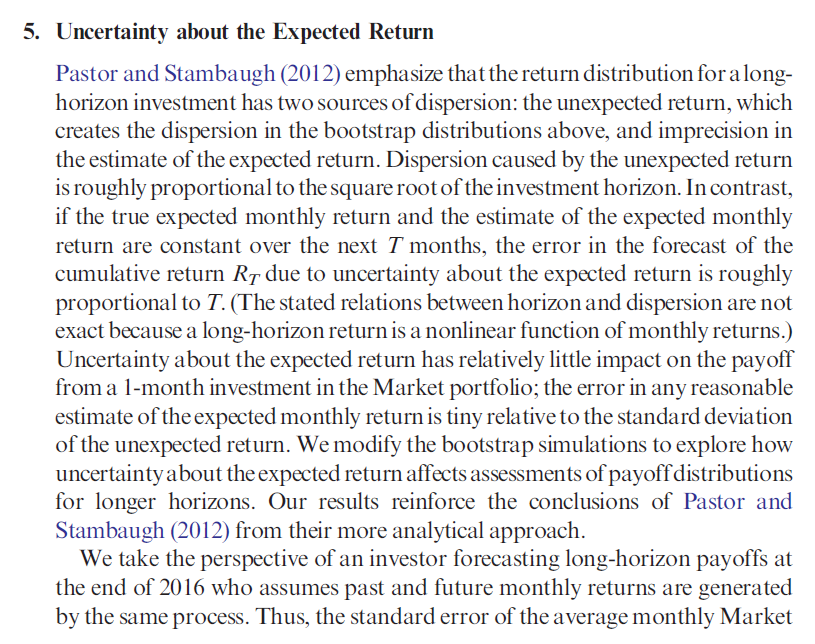

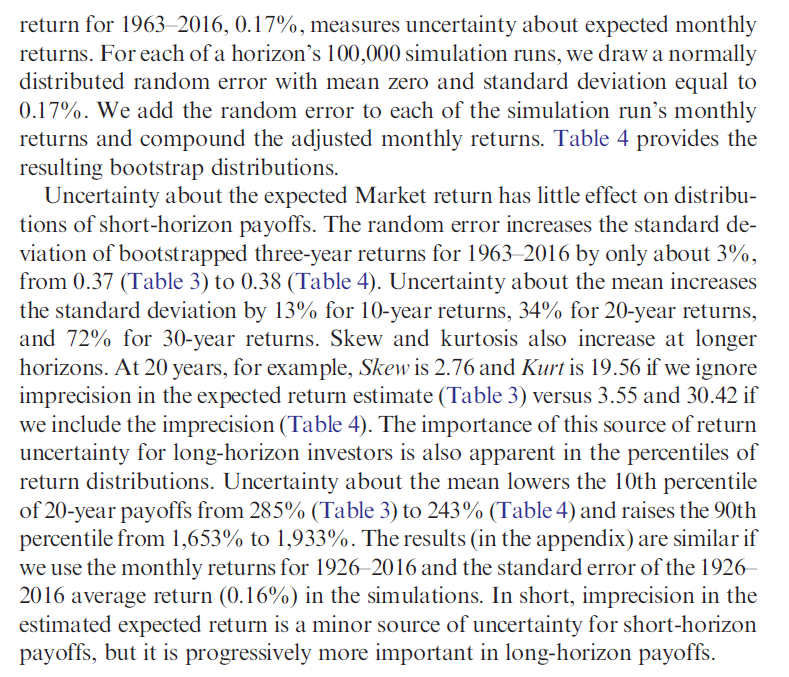

In [83]:
from IPython.core.display import Image, display
display(Image("FF_snippet_1.png", width=750, unconfined=True))
display(Image("FF_snippet_2.png", width=750, unconfined=True))

<a id='Chapter8'></a>
# Chapter 8: References

## Papers
- **[Arnott, R. D., Harvey, C. R., Kalesnik, V., & Linnainmaa, J. T. (2019). Alice’s Adventures in Factorland: Three Blunders  That Plague Factor Investing. Available at SSRN 3331680.](https://papers.ssrn.com/sol3/papers.cfm?abstract_id=3331680)**
- **[Fama, E. F., & French, K. R. (2018). Long-horizon returns. The Review of Asset Pricing Studies, 8(2), 232-252.](https://academic.oup.com/raps/article-abstract/8/2/232/4810768)**
- **[Fama, E. F., & French, K. R. (2012). Size, value, and momentum in international stock returns. Journal of financial economics, 105(3), 457-472.](https://www.sciencedirect.com/science/article/pii/S0304405X12000931)**
- **[Daniel, K., & Moskowitz, T. J. (2016). Momentum crashes. Journal of Financial Economics, 122(2), 221-247.](https://www.sciencedirect.com/science/article/pii/S0304405X16301490)**
- **[Radovanov, B., & Marcikić, A. (2014). A comparison of four different block bootstrap methods. Croatian Operational Research Review, 5(2), 189-202.](https://scholar.google.be/scholar?hl=nl&as_sdt=0%2C5&q=Radovanov%2C+B.%2C+%26+Marciki%C4%87%2C+A.+%282014%29.+A+comparison+of+four+different+block+bootstrap+methods.+Croatian+Operational+Research+Review%2C+5%282%29%2C+189-202&btnG=)**

- **[Singh, K., & Xie, M. (2008). Bootstrap: a statistical method. Unpublished manuscript, Rutgers University, USA. Retrieved from http://www. stat. rutgers. edu/home/mxie/RCPapers/bootstrap. pdf.](http://www.stat.rutgers.edu/home/mxie/stat586/handout/Bootstrap1.pdf)**
- **[Efron, B. (1992). Bootstrap methods: another look at the jackknife. In Breakthroughs in statistics (pp. 569-593). Springer, New York, NY.](https://scholar.google.be/scholar?hl=nl&as_sdt=0%2C5&q=Efron%2C+B.+%281979%29.+Bootstrap+methods%3A+Another+look+at+jackknife.+Ann.+Stat.+7%2C+1-26&btnG=)**

- **[Carlstein, E. (1986). The use of subseries values for estimating the variance of a general statistic from a stationary sequence. The annals of statistics, 14(3), 1171-1179.](https://scholar.google.be/scholar?hl=nl&as_sdt=0%2C5&q=Carlstein+%281986%29&btnG=)**

## Blogs, websites, presentations ...

- **http://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html**
- **http://keplerianfinance.com/2013/06/the-relevance-of-history/**
- **https://www.youtube.com/watch?v=27x632vOjXk&t=3349s**
- **https://www.youtube.com/watch?v=BtiqH_7d2es&t=28s**
- **http://www.blackarbs.com/blog/synthetic-data-generation-part-1-block-bootstrapping**
- **https://arch.readthedocs.io/en/latest/bootstrap/timeseries-bootstraps.html**
- **https://pandas-datareader.readthedocs.io/en/latest/remote_data.html**
- **http://www.ievbras.ru/ecostat/Kiril/R/Biblio_N/R_Eng/Chernick2011.pdf?fbclid=IwAR1f8UAc6s7FAGykclIB0usn0U9RGibNf6sB5ug2z9DEx9DoCK7Q-8nMVLk**
- **http://www.quantdevel.com/public/CSP2015/Talk/BootstrappingTimeSeriesData.pdf?fbclid=IwAR3FiKvHjfrg9zGZkm8aa07vMT15PkpxAYFLqvR50uBdGIjOgM0AY0nsd2U**
- **https://www.youtube.com/watch?v=-M1UtvoajUY**
- **https://www.winton.com/research/value-size-and-momentum-a-likely-example-of-selection-bias**